In [8]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import pandas as pd
import inspect

In [69]:
lines = inspect.getsource(librosa.feature.rms)
print(lines)

def rms(
    y=None, S=None, frame_length=2048, hop_length=512, center=True, pad_mode="reflect"
):
    """Compute root-mean-square (RMS) value for each frame, either from the
    audio samples ``y`` or from a spectrogram ``S``.

    Computing the RMS value from audio samples is faster as it doesn't require
    a STFT calculation. However, using a spectrogram will give a more accurate
    representation of energy over time because its frames can be windowed,
    thus prefer using ``S`` if it's already available.


    Parameters
    ----------
    y : np.ndarray [shape=(n,)] or None
        (optional) audio time series. Required if ``S`` is not input.

    S : np.ndarray [shape=(d, t)] or None
        (optional) spectrogram magnitude. Required if ``y`` is not input.

    frame_length : int > 0 [scalar]
        length of analysis frame (in samples) for energy calculation

    hop_length : int > 0 [scalar]
        hop length for STFT. See `librosa.stft` for details.

    center : bool
   

In [70]:
lines = inspect.getsource(librosa.frames_to_time)
print(lines)

def frames_to_time(frames, sr=22050, hop_length=512, n_fft=None):
    """Converts frame counts to time (seconds).

    Parameters
    ----------
    frames     : np.ndarray [shape=(n,)]
        frame index or vector of frame indices

    sr         : number > 0 [scalar]
        audio sampling rate

    hop_length : int > 0 [scalar]
        number of samples between successive frames

    n_fft : None or int > 0 [scalar]
        Optional: length of the FFT window.
        If given, time conversion will include an offset of ``n_fft // 2``
        to counteract windowing effects when using a non-centered STFT.

    Returns
    -------
    times : np.ndarray [shape=(n,)]
        time (in seconds) of each given frame number::

            times[i] = frames[i] * hop_length / sr

    See Also
    --------
    time_to_frames : convert time values to frame indices
    frames_to_samples : convert frame indices to sample indices

    Examples
    --------
    >>> y, sr = librosa.load(librosa.ex('

Useful info on RMSE (RMS Energy) https://musicinformationretrieval.com/energy.html

Text(0.5, 1.0, 'StudySeq1')

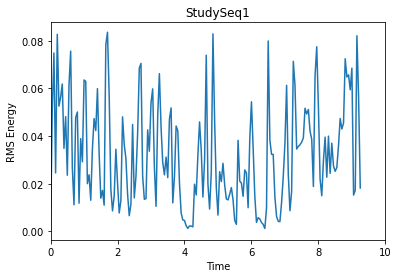

In [90]:
studyseq1_path = "StudySeq1.wav"
studyseq1, sr = librosa.load(studyseq1_path, sr = 44100)

frame_length = 2205 # Samples Per Frame = Sample Rate / FPS = 44100 / 20 = 2205
hop_length = 2205

rms_studyseq1 = librosa.feature.rms(studyseq1, hop_length=hop_length, frame_length=frame_length, center=False)[0]

frames = range(len(rms_studyseq1))
t = librosa.frames_to_time(frames, hop_length=hop_length, sr=sr)
plt.plot(t, rms_studyseq1)
plt.xlabel("Time")
plt.ylabel("RMS Energy")
plt.xlim((0,10))
plt.title("StudySeq1")

Text(0.5, 1.0, 'StudySeq1')

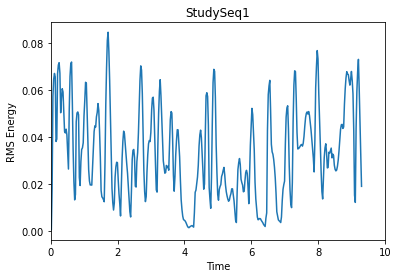

In [89]:
studyseq1_path = "StudySeq1.wav"
studyseq1, sr = librosa.load(studyseq1_path)

rms_studyseq1 = librosa.feature.rms(studyseq1)[0]

frames = range(len(rms_studyseq1))
t = librosa.frames_to_time(frames)
plt.plot(t, rms_studyseq1)
plt.xlabel("Time")
plt.ylabel("RMS Energy")
plt.xlim((0,10))
plt.title("StudySeq1")

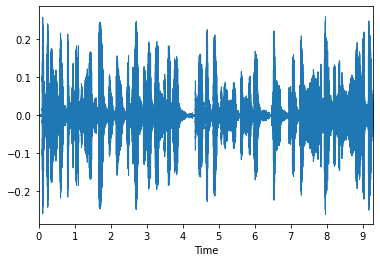

In [49]:
librosa.display.waveplot(studyseq1, sr=sr)

Mean RMS Energy (scaled so that max is 1) =  0.39572784
Mean Energy (scaled so that max is 1) =  0.20847450321461095
Mean RMS Energy =  0.03354188
Mean Energ =  3.067358006303089


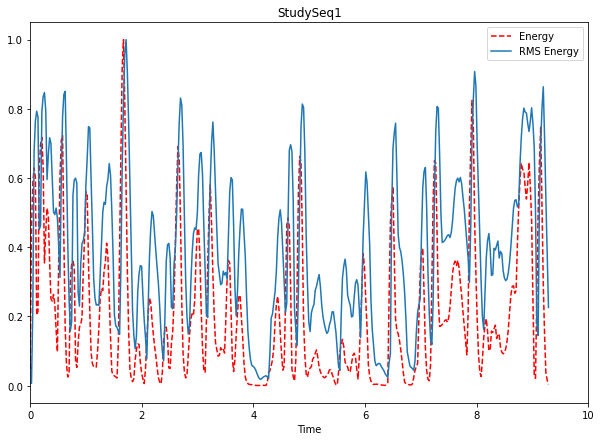

In [122]:
# Energy of Studyseq1 (Source: https://musicinformationretrieval.com/energy.html)
frame_length = 2048
hop_length = 512
x = studyseq1
energy_studyseq1 = np.array([sum(abs(x[i:i+frame_length]**2)) for i in range(0, len(x), hop_length)])

frames = range(len(energy_studyseq1))
t = librosa.frames_to_time(frames, hop_length=hop_length)
plt.figure(figsize=(10,7))
plt.plot(t, energy_studyseq1/np.max(energy_studyseq1), "-r", linestyle='--', label='Energy')
plt.xlabel("Time")
plt.title("StudySeq1")
plt.plot(t, rms_studyseq1/np.max(rms_studyseq1), label="RMS Energy")
plt.xlim((0,10))
plt.legend()

print("Mean RMS Energy (scaled so that max is 1) = ", np.mean(rms_studyseq1/np.max(rms_studyseq1)))
print("Mean Energy (scaled so that max is 1) = ", np.mean(energy_studyseq1/np.max(energy_studyseq1)))

print("Mean RMS Energy = ", np.mean(rms_studyseq1))
print("Mean Energ = ", np.mean(energy_studyseq1))

# Computing RMS Energy for all audio files

In [62]:
df_rows = []

for i in range(1,41):
    studyseq_path = "StudySeq" + str(i) + ".wav"
    studyseq, sr = librosa.load(studyseq_path)
    
    hop_length = int(np.floor(studyseq.shape[0]/num_of_features))
    
    studyseq_rms = librosa.feature.rms(studyseq, hop_length = hop_length)[0]
    
    df_rows = df_rows + [np.append('StudySeq' + str(i), studyseq_rms)]

In [68]:
df_rms = pd.DataFrame(df_rows, columns=['StudySeq'] + ['RMS_Energy' + str(x) for x in range(1,11)])
df_rms.to_csv("RMS_Energy.csv")

# Computing "RMS Weighted Joint Distance Score" with scaled and shifted rms energy

In [229]:
df = pd.DataFrame(columns = ['Spine_RMS_Distance_Score', 'Spine1_RMS_Distance_Score', 'Spine2_RMS_Distance_Score', 
                             'Spine3_RMS_Distance_Score', 'LeftShoulder_RMS_Distance_Score', 'LeftArm_RMS_Distance_Score', 
                             'LeftForeArm_RMS_Distance_Score', 'LeftHand_RMS_Distance_Score', 
                             'RightShoulder_RMS_Distance_Score', 'RightArm_RMS_Distance_Score', 
                             'RightForeArm_RMS_Distance_Score', 'RightHand_RMS_Distance_Score', 'Neck_RMS_Distance_Score', 
                             'Neck1_RMS_Distance_Score', 'Head_RMS_Distance_Score'])
Conds = ['Cond_BA', 'Cond_BT', 'Cond_N', 'Cond_M', 'Cond_SA', 'Cond_SB', 'Cond_SC', 'Cond_SD', 'Cond_SE']

for cond in Conds:
    for i in range(1,41):
        studyseq_motion_path = "../" + cond + "/joint_distances_between_frames/" + "StudySeq" + str(i) + ".csv"
        studyseq_motion = pd.read_csv(studyseq_motion_path).iloc[:,1:] # Drop the first column as it is indexing
        num_of_frames = studyseq_motion.shape[0] 
        # Note that num_of_frames here does not refer to the number of frames in the StudySeq bvh file
        # It infact refers to that number - 1.
        
        studyseq_audio_path = "StudySeq" + str(i) + ".wav"
        studyseq_audio, sr = librosa.load(studyseq_audio_path)

        hop_length = int(np.floor(studyseq_audio.shape[0]/(num_of_frames-1)))
        studyseq_rms = librosa.feature.rms(studyseq_audio, hop_length = hop_length)[0]
        
        # Scaling and Shifting the rms so that it's max value is 1 and its mean 0.
        
        studyseq_rms = studyseq_rms - np.mean(studyseq_rms) # 0 mean
        studyseq_rms = studyseq_rms / np.max(studyseq_rms) # max 1

        # Weighting the joint distances between frames with the rms energy
        studyseq_weighted_motion = studyseq_motion.multiply(studyseq_rms, axis = 'index')
        
        # Taking the avg of scores for each joint
        avg_weighted_motion = studyseq_weighted_motion.mean()
        
        # Adding Studyseq and Score to a dataframe
        rename_dict = dict(zip(avg_weighted_motion.index, [x[:x.index("_")] + "_RMS_Distance_Score" for x in studyseq_motion.columns]))
        avg_weighted_motion = avg_weighted_motion.rename(rename_dict)
        avg_weighted_motion = avg_weighted_motion.rename(cond + "/StudySeq" + str(i))
        df = df.append(avg_weighted_motion)

write_path = "../Appropriateness_Features/RMS_Distance_scores.csv"
df.to_csv(write_path)

# Computing "RMS Weighted Joint Distance Score" without scaled and shifted rms energy

In [3]:
df = pd.DataFrame(columns = ['Spine_RMS_Distance_Score', 'Spine1_RMS_Distance_Score', 'Spine2_RMS_Distance_Score', 
                             'Spine3_RMS_Distance_Score', 'LeftShoulder_RMS_Distance_Score', 'LeftArm_RMS_Distance_Score', 
                             'LeftForeArm_RMS_Distance_Score', 'LeftHand_RMS_Distance_Score', 
                             'RightShoulder_RMS_Distance_Score', 'RightArm_RMS_Distance_Score', 
                             'RightForeArm_RMS_Distance_Score', 'RightHand_RMS_Distance_Score', 'Neck_RMS_Distance_Score', 
                             'Neck1_RMS_Distance_Score', 'Head_RMS_Distance_Score'])
Conds = ['Cond_BA', 'Cond_BT', 'Cond_N', 'Cond_M', 'Cond_SA', 'Cond_SB', 'Cond_SC', 'Cond_SD', 'Cond_SE']

for cond in Conds:
    for n in range(0,10):
        for i in range(1,81):
            studyseq_idx = (n*80)+i
            audio_idx = i
            print(cond, audio_idx, studyseq_idx)
            studyseq_motion_path = "../" + cond + "/joint_distances_between_frames/" + "StudySeq" + str(studyseq_idx) + ".csv"
            studyseq_motion = pd.read_csv(studyseq_motion_path).iloc[:,1:] # Drop the first column as it is indexing

            studyseq_audio_path = "StudySeq" + str(audio_idx) + ".wav"
            studyseq_audio, sr = librosa.load(studyseq_audio_path, sr=44100)

            frame_length = 2205 # Samples Per Frame = Sample Rate / FPS = 44100 / 20 = 2205
            hop_length = 2205

            studyseq_rms = librosa.feature.rms(studyseq_audio, hop_length=hop_length, frame_length=frame_length, center=False)[0]

            # Need to do a check for the Studyseqs of Cond_M since some of the videos have 1 additional frame.
            num_of_frames_motion = studyseq_motion.shape[0] + 1
            num_of_frames_audio = np.size(studyseq_rms)
            if (cond == 'Cond_M' and num_of_frames_motion == num_of_frames_audio + 1):
                # If the Cond_M studyseq has an additional frame dont discard the last frame of audio:
                studyseq_weighted_motion = studyseq_motion.multiply(studyseq_rms, axis = 'index')
            else:
                # Weighting the joint distances between frames with the rms energy
                studyseq_weighted_motion = studyseq_motion.multiply(studyseq_rms[:-1], axis = 'index')

            # Taking the avg of scores for each joint
            avg_weighted_motion = studyseq_weighted_motion.mean()

            # Adding Studyseq and Score to a dataframe
            rename_dict = dict(zip(avg_weighted_motion.index, [x[:x.index("_")] + "_RMS_Distance_Score" for x in studyseq_motion.columns]))
            avg_weighted_motion = avg_weighted_motion.rename(rename_dict)
            avg_weighted_motion = avg_weighted_motion.rename(cond + "/StudySeq" + str(studyseq_idx))
            df = df.append(avg_weighted_motion)

write_path = "../Appropriateness_Features/RMS_Distance_scores_unscaled.csv"
df.to_csv(write_path)

Cond_BA 1 1
Cond_BA 2 2
Cond_BA 3 3
Cond_BA 4 4
Cond_BA 5 5
Cond_BA 6 6
Cond_BA 7 7
Cond_BA 8 8
Cond_BA 9 9
Cond_BA 10 10
Cond_BA 11 11
Cond_BA 12 12
Cond_BA 13 13
Cond_BA 14 14
Cond_BA 15 15
Cond_BA 16 16
Cond_BA 17 17
Cond_BA 18 18
Cond_BA 19 19
Cond_BA 20 20
Cond_BA 21 21
Cond_BA 22 22
Cond_BA 23 23
Cond_BA 24 24
Cond_BA 25 25
Cond_BA 26 26
Cond_BA 27 27
Cond_BA 28 28
Cond_BA 29 29
Cond_BA 30 30
Cond_BA 31 31
Cond_BA 32 32
Cond_BA 33 33
Cond_BA 34 34
Cond_BA 35 35
Cond_BA 36 36
Cond_BA 37 37
Cond_BA 38 38
Cond_BA 39 39
Cond_BA 40 40
Cond_BA 41 41
Cond_BA 42 42
Cond_BA 43 43
Cond_BA 44 44
Cond_BA 45 45
Cond_BA 46 46
Cond_BA 47 47
Cond_BA 48 48
Cond_BA 49 49
Cond_BA 50 50
Cond_BA 51 51
Cond_BA 52 52
Cond_BA 53 53
Cond_BA 54 54
Cond_BA 55 55
Cond_BA 56 56
Cond_BA 57 57
Cond_BA 58 58
Cond_BA 59 59
Cond_BA 60 60
Cond_BA 61 61
Cond_BA 62 62
Cond_BA 63 63
Cond_BA 64 64
Cond_BA 65 65
Cond_BA 66 66
Cond_BA 67 67
Cond_BA 68 68
Cond_BA 69 69
Cond_BA 70 70
Cond_BA 71 71
Cond_BA 72 72
Cond_BA 73

KeyboardInterrupt: 

# Computing Windowed "RMS Weighted Joint Distance Score" without scaled and shifted rms energy

In [10]:
df = pd.DataFrame(columns = ['Spine_RMS_Distance_Score', 'Spine1_RMS_Distance_Score', 'Spine2_RMS_Distance_Score', 
                             'Spine3_RMS_Distance_Score', 'LeftShoulder_RMS_Distance_Score', 'LeftArm_RMS_Distance_Score', 
                             'LeftForeArm_RMS_Distance_Score', 'LeftHand_RMS_Distance_Score', 
                             'RightShoulder_RMS_Distance_Score', 'RightArm_RMS_Distance_Score', 
                             'RightForeArm_RMS_Distance_Score', 'RightHand_RMS_Distance_Score', 'Neck_RMS_Distance_Score', 
                             'Neck1_RMS_Distance_Score', 'Head_RMS_Distance_Score'])
Conds = ['Cond_BA', 'Cond_BT', 'Cond_N', 'Cond_M', 'Cond_SA', 'Cond_SB', 'Cond_SC', 'Cond_SD', 'Cond_SE']

for cond in Conds:
    for n in range(0,10):
        for i in range(1,81):
            studyseq_idx = (n*80)+i
            audio_idx = i
            print(cond, audio_idx, studyseq_idx)

            studyseq_motion_path = "../" + cond + "/joint_distances_between_frames/" + "StudySeq" + str(studyseq_idx) + ".csv"
            studyseq_motion = pd.read_csv(studyseq_motion_path).iloc[:,1:] # Drop the first column as it is indexing

            studyseq_audio_path = "StudySeq" + str(audio_idx) + ".wav"
            studyseq_audio, sr = librosa.load(studyseq_audio_path, sr=44100)

            frame_length = 2205 # Samples Per Frame = Sample Rate / FPS = 44100 / 20 = 2205
            hop_length = 2205

            studyseq_rms = librosa.feature.rms(studyseq_audio, hop_length=hop_length, frame_length=frame_length, center=False)[0]

            # Need to do a check for the Studyseqs of Cond_M since some of the videos have 1 additional frame.
            num_of_frames_motion = studyseq_motion.shape[0] + 1
            num_of_frames_audio = np.size(studyseq_rms)
            window_length = 10 # for windowing
            if (cond == 'Cond_M' and num_of_frames_motion == num_of_frames_audio + 1):
                # If the Cond_M studyseq has an additional frame dont discard the last frame of audio:
                studyseq_motion_array = studyseq_motion.to_numpy()
                windowed_motion = np.asarray([sum(studyseq_motion_array[x:x+window_length]) for x in range(0,len(studyseq_motion_array) - window_length + 1)])

                windowed_audio = np.asarray([sum(studyseq_rms[x:x+window_length]) for x in range(0,len(studyseq_rms) - window_length + 1)])
                windowed_audio = np.tile(np.reshape(windowed_audio, (np.shape(windowed_audio)[0],1)), (1,np.shape(windowed_motion)[1]))
                print(np.shape(windowed_audio), np.shape(windowed_motion))
                studyseq_weighted_motion = np.mean(windowed_motion * windowed_audio, axis=0)
            else:
                # Weighting the joint distances between frames with the rms energy
                studyseq_motion_array = studyseq_motion.to_numpy()
                windowed_motion = np.asarray([sum(studyseq_motion_array[x:x+window_length]) for x in range(0,len(studyseq_motion_array) - window_length + 1)])

                studyseq_rms = studyseq_rms[:-1]
                windowed_audio = np.asarray([sum(studyseq_rms[x:x+window_length]) for x in range(0,len(studyseq_rms) - window_length + 1)])
                windowed_audio = np.tile(np.reshape(windowed_audio, (np.shape(windowed_audio)[0],1)), (1,np.shape(windowed_motion)[1]))
                print(np.shape(windowed_audio), np.shape(windowed_motion))
                studyseq_weighted_motion = np.mean(windowed_motion * windowed_audio, axis=0)


            # Adding Studyseq and Score to a dataframe
            idx = [x[:x.index("_")] + "_RMS_Distance_Score" for x in studyseq_motion.columns]
            rms_distance_series = pd.Series(data=studyseq_weighted_motion, index=idx, name=cond + "/StudySeq" + str(studyseq_idx))
            df = df.append(rms_distance_series)

write_path = "../Appropriateness_Features/RMS_Distance_scores_windowed.csv"
df.to_csv(write_path)

Cond_BA 1 1
(176, 15) (176, 15)
Cond_BA 2 2
(206, 15) (206, 15)
Cond_BA 3 3
(142, 15) (142, 15)
Cond_BA 4 4
(160, 15) (160, 15)
Cond_BA 5 5
(178, 15) (178, 15)
Cond_BA 6 6
(192, 15) (192, 15)
Cond_BA 7 7
(190, 15) (190, 15)
Cond_BA 8 8
(190, 15) (190, 15)
Cond_BA 9 9
(186, 15) (186, 15)
Cond_BA 10 10
(186, 15) (186, 15)
Cond_BA 11 11
(186, 15) (186, 15)
Cond_BA 12 12
(228, 15) (228, 15)
Cond_BA 13 13
(158, 15) (158, 15)
Cond_BA 14 14
(226, 15) (226, 15)
Cond_BA 15 15
(182, 15) (182, 15)
Cond_BA 16 16
(244, 15) (244, 15)
Cond_BA 17 17
(184, 15) (184, 15)
Cond_BA 18 18
(240, 15) (240, 15)
Cond_BA 19 19
(238, 15) (238, 15)
Cond_BA 20 20
(218, 15) (218, 15)
Cond_BA 21 21
(212, 15) (212, 15)
Cond_BA 22 22
(148, 15) (148, 15)
Cond_BA 23 23
(180, 15) (180, 15)
Cond_BA 24 24
(192, 15) (192, 15)
Cond_BA 25 25
(210, 15) (210, 15)
Cond_BA 26 26
(196, 15) (196, 15)
Cond_BA 27 27
(158, 15) (158, 15)
Cond_BA 28 28
(178, 15) (178, 15)
Cond_BA 29 29
(204, 15) (204, 15)
Cond_BA 30 30
(212, 15) (212, 15

(178, 15) (178, 15)
Cond_BA 6 246
(192, 15) (192, 15)
Cond_BA 7 247
(190, 15) (190, 15)
Cond_BA 8 248
(190, 15) (190, 15)
Cond_BA 9 249
(186, 15) (186, 15)
Cond_BA 10 250
(186, 15) (186, 15)
Cond_BA 11 251
(186, 15) (186, 15)
Cond_BA 12 252
(228, 15) (228, 15)
Cond_BA 13 253
(158, 15) (158, 15)
Cond_BA 14 254
(226, 15) (226, 15)
Cond_BA 15 255
(182, 15) (182, 15)
Cond_BA 16 256
(244, 15) (244, 15)
Cond_BA 17 257
(184, 15) (184, 15)
Cond_BA 18 258
(240, 15) (240, 15)
Cond_BA 19 259
(238, 15) (238, 15)
Cond_BA 20 260
(218, 15) (218, 15)
Cond_BA 21 261
(212, 15) (212, 15)
Cond_BA 22 262
(148, 15) (148, 15)
Cond_BA 23 263
(180, 15) (180, 15)
Cond_BA 24 264
(192, 15) (192, 15)
Cond_BA 25 265
(210, 15) (210, 15)
Cond_BA 26 266
(196, 15) (196, 15)
Cond_BA 27 267
(158, 15) (158, 15)
Cond_BA 28 268
(178, 15) (178, 15)
Cond_BA 29 269
(204, 15) (204, 15)
Cond_BA 30 270
(212, 15) (212, 15)
Cond_BA 31 271
(160, 15) (160, 15)
Cond_BA 32 272
(208, 15) (208, 15)
Cond_BA 33 273
(180, 15) (180, 15)
Cond

Cond_BA 6 486
(192, 15) (192, 15)
Cond_BA 7 487
(190, 15) (190, 15)
Cond_BA 8 488
(190, 15) (190, 15)
Cond_BA 9 489
(186, 15) (186, 15)
Cond_BA 10 490
(186, 15) (186, 15)
Cond_BA 11 491
(186, 15) (186, 15)
Cond_BA 12 492
(228, 15) (228, 15)
Cond_BA 13 493
(158, 15) (158, 15)
Cond_BA 14 494
(226, 15) (226, 15)
Cond_BA 15 495
(182, 15) (182, 15)
Cond_BA 16 496
(244, 15) (244, 15)
Cond_BA 17 497
(184, 15) (184, 15)
Cond_BA 18 498
(240, 15) (240, 15)
Cond_BA 19 499
(238, 15) (238, 15)
Cond_BA 20 500
(218, 15) (218, 15)
Cond_BA 21 501
(212, 15) (212, 15)
Cond_BA 22 502
(148, 15) (148, 15)
Cond_BA 23 503
(180, 15) (180, 15)
Cond_BA 24 504
(192, 15) (192, 15)
Cond_BA 25 505
(210, 15) (210, 15)
Cond_BA 26 506
(196, 15) (196, 15)
Cond_BA 27 507
(158, 15) (158, 15)
Cond_BA 28 508
(178, 15) (178, 15)
Cond_BA 29 509
(204, 15) (204, 15)
Cond_BA 30 510
(212, 15) (212, 15)
Cond_BA 31 511
(160, 15) (160, 15)
Cond_BA 32 512
(208, 15) (208, 15)
Cond_BA 33 513
(180, 15) (180, 15)
Cond_BA 34 514
(192, 15)

Cond_BA 9 729
(186, 15) (186, 15)
Cond_BA 10 730
(186, 15) (186, 15)
Cond_BA 11 731
(186, 15) (186, 15)
Cond_BA 12 732
(228, 15) (228, 15)
Cond_BA 13 733
(158, 15) (158, 15)
Cond_BA 14 734
(226, 15) (226, 15)
Cond_BA 15 735
(182, 15) (182, 15)
Cond_BA 16 736
(244, 15) (244, 15)
Cond_BA 17 737
(184, 15) (184, 15)
Cond_BA 18 738
(240, 15) (240, 15)
Cond_BA 19 739
(238, 15) (238, 15)
Cond_BA 20 740
(218, 15) (218, 15)
Cond_BA 21 741
(212, 15) (212, 15)
Cond_BA 22 742
(148, 15) (148, 15)
Cond_BA 23 743
(180, 15) (180, 15)
Cond_BA 24 744
(192, 15) (192, 15)
Cond_BA 25 745
(210, 15) (210, 15)
Cond_BA 26 746
(196, 15) (196, 15)
Cond_BA 27 747
(158, 15) (158, 15)
Cond_BA 28 748
(178, 15) (178, 15)
Cond_BA 29 749
(204, 15) (204, 15)
Cond_BA 30 750
(212, 15) (212, 15)
Cond_BA 31 751
(160, 15) (160, 15)
Cond_BA 32 752
(208, 15) (208, 15)
Cond_BA 33 753
(180, 15) (180, 15)
Cond_BA 34 754
(192, 15) (192, 15)
Cond_BA 35 755
(198, 15) (198, 15)
Cond_BA 36 756
(202, 15) (202, 15)
Cond_BA 37 757
(202, 

Cond_BT 11 171
(186, 15) (186, 15)
Cond_BT 12 172
(228, 15) (228, 15)
Cond_BT 13 173
(158, 15) (158, 15)
Cond_BT 14 174
(226, 15) (226, 15)
Cond_BT 15 175
(182, 15) (182, 15)
Cond_BT 16 176
(244, 15) (244, 15)
Cond_BT 17 177
(184, 15) (184, 15)
Cond_BT 18 178
(240, 15) (240, 15)
Cond_BT 19 179
(238, 15) (238, 15)
Cond_BT 20 180
(218, 15) (218, 15)
Cond_BT 21 181
(212, 15) (212, 15)
Cond_BT 22 182
(148, 15) (148, 15)
Cond_BT 23 183
(180, 15) (180, 15)
Cond_BT 24 184
(192, 15) (192, 15)
Cond_BT 25 185
(210, 15) (210, 15)
Cond_BT 26 186
(196, 15) (196, 15)
Cond_BT 27 187
(158, 15) (158, 15)
Cond_BT 28 188
(178, 15) (178, 15)
Cond_BT 29 189
(204, 15) (204, 15)
Cond_BT 30 190
(212, 15) (212, 15)
Cond_BT 31 191
(160, 15) (160, 15)
Cond_BT 32 192
(208, 15) (208, 15)
Cond_BT 33 193
(180, 15) (180, 15)
Cond_BT 34 194
(192, 15) (192, 15)
Cond_BT 35 195
(198, 15) (198, 15)
Cond_BT 36 196
(202, 15) (202, 15)
Cond_BT 37 197
(202, 15) (202, 15)
Cond_BT 38 198
(138, 15) (138, 15)
Cond_BT 39 199
(180,

(186, 15) (186, 15)
Cond_BT 12 412
(228, 15) (228, 15)
Cond_BT 13 413
(158, 15) (158, 15)
Cond_BT 14 414
(226, 15) (226, 15)
Cond_BT 15 415
(182, 15) (182, 15)
Cond_BT 16 416
(244, 15) (244, 15)
Cond_BT 17 417
(184, 15) (184, 15)
Cond_BT 18 418
(240, 15) (240, 15)
Cond_BT 19 419
(238, 15) (238, 15)
Cond_BT 20 420
(218, 15) (218, 15)
Cond_BT 21 421
(212, 15) (212, 15)
Cond_BT 22 422
(148, 15) (148, 15)
Cond_BT 23 423
(180, 15) (180, 15)
Cond_BT 24 424
(192, 15) (192, 15)
Cond_BT 25 425
(210, 15) (210, 15)
Cond_BT 26 426
(196, 15) (196, 15)
Cond_BT 27 427
(158, 15) (158, 15)
Cond_BT 28 428
(178, 15) (178, 15)
Cond_BT 29 429
(204, 15) (204, 15)
Cond_BT 30 430
(212, 15) (212, 15)
Cond_BT 31 431
(160, 15) (160, 15)
Cond_BT 32 432
(208, 15) (208, 15)
Cond_BT 33 433
(180, 15) (180, 15)
Cond_BT 34 434
(192, 15) (192, 15)
Cond_BT 35 435
(198, 15) (198, 15)
Cond_BT 36 436
(202, 15) (202, 15)
Cond_BT 37 437
(202, 15) (202, 15)
Cond_BT 38 438
(138, 15) (138, 15)
Cond_BT 39 439
(180, 15) (180, 15)


Cond_BT 14 654
(226, 15) (226, 15)
Cond_BT 15 655
(182, 15) (182, 15)
Cond_BT 16 656
(244, 15) (244, 15)
Cond_BT 17 657
(184, 15) (184, 15)
Cond_BT 18 658
(240, 15) (240, 15)
Cond_BT 19 659
(238, 15) (238, 15)
Cond_BT 20 660
(218, 15) (218, 15)
Cond_BT 21 661
(212, 15) (212, 15)
Cond_BT 22 662
(148, 15) (148, 15)
Cond_BT 23 663
(180, 15) (180, 15)
Cond_BT 24 664
(192, 15) (192, 15)
Cond_BT 25 665
(210, 15) (210, 15)
Cond_BT 26 666
(196, 15) (196, 15)
Cond_BT 27 667
(158, 15) (158, 15)
Cond_BT 28 668
(178, 15) (178, 15)
Cond_BT 29 669
(204, 15) (204, 15)
Cond_BT 30 670
(212, 15) (212, 15)
Cond_BT 31 671
(160, 15) (160, 15)
Cond_BT 32 672
(208, 15) (208, 15)
Cond_BT 33 673
(180, 15) (180, 15)
Cond_BT 34 674
(192, 15) (192, 15)
Cond_BT 35 675
(198, 15) (198, 15)
Cond_BT 36 676
(202, 15) (202, 15)
Cond_BT 37 677
(202, 15) (202, 15)
Cond_BT 38 678
(138, 15) (138, 15)
Cond_BT 39 679
(180, 15) (180, 15)
Cond_BT 40 680
(134, 15) (134, 15)
Cond_BT 41 681
(176, 15) (176, 15)
Cond_BT 42 682
(206,

Cond_N 20 100
(218, 15) (218, 15)
Cond_N 21 101
(212, 15) (212, 15)
Cond_N 22 102
(148, 15) (148, 15)
Cond_N 23 103
(180, 15) (180, 15)
Cond_N 24 104
(192, 15) (192, 15)
Cond_N 25 105
(210, 15) (210, 15)
Cond_N 26 106
(196, 15) (196, 15)
Cond_N 27 107
(158, 15) (158, 15)
Cond_N 28 108
(178, 15) (178, 15)
Cond_N 29 109
(204, 15) (204, 15)
Cond_N 30 110
(212, 15) (212, 15)
Cond_N 31 111
(160, 15) (160, 15)
Cond_N 32 112
(208, 15) (208, 15)
Cond_N 33 113
(180, 15) (180, 15)
Cond_N 34 114
(192, 15) (192, 15)
Cond_N 35 115
(198, 15) (198, 15)
Cond_N 36 116
(202, 15) (202, 15)
Cond_N 37 117
(202, 15) (202, 15)
Cond_N 38 118
(138, 15) (138, 15)
Cond_N 39 119
(180, 15) (180, 15)
Cond_N 40 120
(134, 15) (134, 15)
Cond_N 41 121
(176, 15) (176, 15)
Cond_N 42 122
(206, 15) (206, 15)
Cond_N 43 123
(142, 15) (142, 15)
Cond_N 44 124
(160, 15) (160, 15)
Cond_N 45 125
(178, 15) (178, 15)
Cond_N 46 126
(192, 15) (192, 15)
Cond_N 47 127
(190, 15) (190, 15)
Cond_N 48 128
(190, 15) (190, 15)
Cond_N 49 129


Cond_N 28 348
(178, 15) (178, 15)
Cond_N 29 349
(204, 15) (204, 15)
Cond_N 30 350
(212, 15) (212, 15)
Cond_N 31 351
(160, 15) (160, 15)
Cond_N 32 352
(208, 15) (208, 15)
Cond_N 33 353
(180, 15) (180, 15)
Cond_N 34 354
(192, 15) (192, 15)
Cond_N 35 355
(198, 15) (198, 15)
Cond_N 36 356
(202, 15) (202, 15)
Cond_N 37 357
(202, 15) (202, 15)
Cond_N 38 358
(138, 15) (138, 15)
Cond_N 39 359
(180, 15) (180, 15)
Cond_N 40 360
(134, 15) (134, 15)
Cond_N 41 361
(176, 15) (176, 15)
Cond_N 42 362
(206, 15) (206, 15)
Cond_N 43 363
(142, 15) (142, 15)
Cond_N 44 364
(160, 15) (160, 15)
Cond_N 45 365
(178, 15) (178, 15)
Cond_N 46 366
(192, 15) (192, 15)
Cond_N 47 367
(190, 15) (190, 15)
Cond_N 48 368
(190, 15) (190, 15)
Cond_N 49 369
(186, 15) (186, 15)
Cond_N 50 370
(186, 15) (186, 15)
Cond_N 51 371
(186, 15) (186, 15)
Cond_N 52 372
(228, 15) (228, 15)
Cond_N 53 373
(158, 15) (158, 15)
Cond_N 54 374
(226, 15) (226, 15)
Cond_N 55 375
(182, 15) (182, 15)
Cond_N 56 376
(244, 15) (244, 15)
Cond_N 57 377


(160, 15) (160, 15)
Cond_N 32 592
(208, 15) (208, 15)
Cond_N 33 593
(180, 15) (180, 15)
Cond_N 34 594
(192, 15) (192, 15)
Cond_N 35 595
(198, 15) (198, 15)
Cond_N 36 596
(202, 15) (202, 15)
Cond_N 37 597
(202, 15) (202, 15)
Cond_N 38 598
(138, 15) (138, 15)
Cond_N 39 599
(180, 15) (180, 15)
Cond_N 40 600
(134, 15) (134, 15)
Cond_N 41 601
(176, 15) (176, 15)
Cond_N 42 602
(206, 15) (206, 15)
Cond_N 43 603
(142, 15) (142, 15)
Cond_N 44 604
(160, 15) (160, 15)
Cond_N 45 605
(178, 15) (178, 15)
Cond_N 46 606
(192, 15) (192, 15)
Cond_N 47 607
(190, 15) (190, 15)
Cond_N 48 608
(190, 15) (190, 15)
Cond_N 49 609
(186, 15) (186, 15)
Cond_N 50 610
(186, 15) (186, 15)
Cond_N 51 611
(186, 15) (186, 15)
Cond_N 52 612
(228, 15) (228, 15)
Cond_N 53 613
(158, 15) (158, 15)
Cond_N 54 614
(226, 15) (226, 15)
Cond_N 55 615
(182, 15) (182, 15)
Cond_N 56 616
(244, 15) (244, 15)
Cond_N 57 617
(184, 15) (184, 15)
Cond_N 58 618
(240, 15) (240, 15)
Cond_N 59 619
(238, 15) (238, 15)
Cond_N 60 620
(218, 15) (218

Cond_M 40 40
(135, 15) (135, 15)
Cond_M 41 41
(176, 15) (176, 15)
Cond_M 42 42
(207, 15) (207, 15)
Cond_M 43 43
(143, 15) (143, 15)
Cond_M 44 44
(161, 15) (161, 15)
Cond_M 45 45
(179, 15) (179, 15)
Cond_M 46 46
(193, 15) (193, 15)
Cond_M 47 47
(191, 15) (191, 15)
Cond_M 48 48
(191, 15) (191, 15)
Cond_M 49 49
(187, 15) (187, 15)
Cond_M 50 50
(187, 15) (187, 15)
Cond_M 51 51
(187, 15) (187, 15)
Cond_M 52 52
(229, 15) (229, 15)
Cond_M 53 53
(159, 15) (159, 15)
Cond_M 54 54
(227, 15) (227, 15)
Cond_M 55 55
(182, 15) (182, 15)
Cond_M 56 56
(245, 15) (245, 15)
Cond_M 57 57
(185, 15) (185, 15)
Cond_M 58 58
(240, 15) (240, 15)
Cond_M 59 59
(239, 15) (239, 15)
Cond_M 60 60
(219, 15) (219, 15)
Cond_M 61 61
(213, 15) (213, 15)
Cond_M 62 62
(149, 15) (149, 15)
Cond_M 63 63
(181, 15) (181, 15)
Cond_M 64 64
(193, 15) (193, 15)
Cond_M 65 65
(211, 15) (211, 15)
Cond_M 66 66
(197, 15) (197, 15)
Cond_M 67 67
(159, 15) (159, 15)
Cond_M 68 68
(179, 15) (179, 15)
Cond_M 69 69
(205, 15) (205, 15)
Cond_M 70 

Cond_M 44 284
(161, 15) (161, 15)
Cond_M 45 285
(179, 15) (179, 15)
Cond_M 46 286
(193, 15) (193, 15)
Cond_M 47 287
(191, 15) (191, 15)
Cond_M 48 288
(191, 15) (191, 15)
Cond_M 49 289
(187, 15) (187, 15)
Cond_M 50 290
(187, 15) (187, 15)
Cond_M 51 291
(187, 15) (187, 15)
Cond_M 52 292
(229, 15) (229, 15)
Cond_M 53 293
(159, 15) (159, 15)
Cond_M 54 294
(227, 15) (227, 15)
Cond_M 55 295
(182, 15) (182, 15)
Cond_M 56 296
(245, 15) (245, 15)
Cond_M 57 297
(185, 15) (185, 15)
Cond_M 58 298
(240, 15) (240, 15)
Cond_M 59 299
(239, 15) (239, 15)
Cond_M 60 300
(219, 15) (219, 15)
Cond_M 61 301
(213, 15) (213, 15)
Cond_M 62 302
(149, 15) (149, 15)
Cond_M 63 303
(181, 15) (181, 15)
Cond_M 64 304
(193, 15) (193, 15)
Cond_M 65 305
(211, 15) (211, 15)
Cond_M 66 306
(197, 15) (197, 15)
Cond_M 67 307
(159, 15) (159, 15)
Cond_M 68 308
(179, 15) (179, 15)
Cond_M 69 309
(205, 15) (205, 15)
Cond_M 70 310
(213, 15) (213, 15)
Cond_M 71 311
(161, 15) (161, 15)
Cond_M 72 312
(208, 15) (208, 15)
Cond_M 73 313


(191, 15) (191, 15)
Cond_M 49 529
(187, 15) (187, 15)
Cond_M 50 530
(187, 15) (187, 15)
Cond_M 51 531
(187, 15) (187, 15)
Cond_M 52 532
(229, 15) (229, 15)
Cond_M 53 533
(159, 15) (159, 15)
Cond_M 54 534
(227, 15) (227, 15)
Cond_M 55 535
(182, 15) (182, 15)
Cond_M 56 536
(245, 15) (245, 15)
Cond_M 57 537
(185, 15) (185, 15)
Cond_M 58 538
(240, 15) (240, 15)
Cond_M 59 539
(239, 15) (239, 15)
Cond_M 60 540
(219, 15) (219, 15)
Cond_M 61 541
(213, 15) (213, 15)
Cond_M 62 542
(149, 15) (149, 15)
Cond_M 63 543
(181, 15) (181, 15)
Cond_M 64 544
(193, 15) (193, 15)
Cond_M 65 545
(211, 15) (211, 15)
Cond_M 66 546
(197, 15) (197, 15)
Cond_M 67 547
(159, 15) (159, 15)
Cond_M 68 548
(179, 15) (179, 15)
Cond_M 69 549
(205, 15) (205, 15)
Cond_M 70 550
(213, 15) (213, 15)
Cond_M 71 551
(161, 15) (161, 15)
Cond_M 72 552
(208, 15) (208, 15)
Cond_M 73 553
(181, 15) (181, 15)
Cond_M 74 554
(193, 15) (193, 15)
Cond_M 75 555
(199, 15) (199, 15)
Cond_M 76 556
(202, 15) (202, 15)
Cond_M 77 557
(202, 15) (202

Cond_M 56 776
(245, 15) (245, 15)
Cond_M 57 777
(185, 15) (185, 15)
Cond_M 58 778
(240, 15) (240, 15)
Cond_M 59 779
(239, 15) (239, 15)
Cond_M 60 780
(219, 15) (219, 15)
Cond_M 61 781
(213, 15) (213, 15)
Cond_M 62 782
(149, 15) (149, 15)
Cond_M 63 783
(181, 15) (181, 15)
Cond_M 64 784
(193, 15) (193, 15)
Cond_M 65 785
(211, 15) (211, 15)
Cond_M 66 786
(197, 15) (197, 15)
Cond_M 67 787
(159, 15) (159, 15)
Cond_M 68 788
(179, 15) (179, 15)
Cond_M 69 789
(205, 15) (205, 15)
Cond_M 70 790
(213, 15) (213, 15)
Cond_M 71 791
(161, 15) (161, 15)
Cond_M 72 792
(208, 15) (208, 15)
Cond_M 73 793
(181, 15) (181, 15)
Cond_M 74 794
(193, 15) (193, 15)
Cond_M 75 795
(199, 15) (199, 15)
Cond_M 76 796
(202, 15) (202, 15)
Cond_M 77 797
(202, 15) (202, 15)
Cond_M 78 798
(138, 15) (138, 15)
Cond_M 79 799
(181, 15) (181, 15)
Cond_M 80 800
(135, 15) (135, 15)
Cond_SA 1 1
(176, 15) (176, 15)
Cond_SA 2 2
(206, 15) (206, 15)
Cond_SA 3 3
(142, 15) (142, 15)
Cond_SA 4 4
(160, 15) (160, 15)
Cond_SA 5 5
(178, 15) 

Cond_SA 57 217
(184, 15) (184, 15)
Cond_SA 58 218
(240, 15) (240, 15)
Cond_SA 59 219
(238, 15) (238, 15)
Cond_SA 60 220
(218, 15) (218, 15)
Cond_SA 61 221
(212, 15) (212, 15)
Cond_SA 62 222
(148, 15) (148, 15)
Cond_SA 63 223
(180, 15) (180, 15)
Cond_SA 64 224
(192, 15) (192, 15)
Cond_SA 65 225
(210, 15) (210, 15)
Cond_SA 66 226
(196, 15) (196, 15)
Cond_SA 67 227
(158, 15) (158, 15)
Cond_SA 68 228
(178, 15) (178, 15)
Cond_SA 69 229
(204, 15) (204, 15)
Cond_SA 70 230
(212, 15) (212, 15)
Cond_SA 71 231
(160, 15) (160, 15)
Cond_SA 72 232
(208, 15) (208, 15)
Cond_SA 73 233
(180, 15) (180, 15)
Cond_SA 74 234
(192, 15) (192, 15)
Cond_SA 75 235
(198, 15) (198, 15)
Cond_SA 76 236
(202, 15) (202, 15)
Cond_SA 77 237
(202, 15) (202, 15)
Cond_SA 78 238
(138, 15) (138, 15)
Cond_SA 79 239
(180, 15) (180, 15)
Cond_SA 80 240
(134, 15) (134, 15)
Cond_SA 1 241
(176, 15) (176, 15)
Cond_SA 2 242
(206, 15) (206, 15)
Cond_SA 3 243
(142, 15) (142, 15)
Cond_SA 4 244
(160, 15) (160, 15)
Cond_SA 5 245
(178, 15) 

(184, 15) (184, 15)
Cond_SA 58 458
(240, 15) (240, 15)
Cond_SA 59 459
(238, 15) (238, 15)
Cond_SA 60 460
(218, 15) (218, 15)
Cond_SA 61 461
(212, 15) (212, 15)
Cond_SA 62 462
(148, 15) (148, 15)
Cond_SA 63 463
(180, 15) (180, 15)
Cond_SA 64 464
(192, 15) (192, 15)
Cond_SA 65 465
(210, 15) (210, 15)
Cond_SA 66 466
(196, 15) (196, 15)
Cond_SA 67 467
(158, 15) (158, 15)
Cond_SA 68 468
(178, 15) (178, 15)
Cond_SA 69 469
(204, 15) (204, 15)
Cond_SA 70 470
(212, 15) (212, 15)
Cond_SA 71 471
(160, 15) (160, 15)
Cond_SA 72 472
(208, 15) (208, 15)
Cond_SA 73 473
(180, 15) (180, 15)
Cond_SA 74 474
(192, 15) (192, 15)
Cond_SA 75 475
(198, 15) (198, 15)
Cond_SA 76 476
(202, 15) (202, 15)
Cond_SA 77 477
(202, 15) (202, 15)
Cond_SA 78 478
(138, 15) (138, 15)
Cond_SA 79 479
(180, 15) (180, 15)
Cond_SA 80 480
(134, 15) (134, 15)
Cond_SA 1 481
(176, 15) (176, 15)
Cond_SA 2 482
(206, 15) (206, 15)
Cond_SA 3 483
(142, 15) (142, 15)
Cond_SA 4 484
(160, 15) (160, 15)
Cond_SA 5 485
(178, 15) (178, 15)
Cond_

Cond_SA 59 699
(238, 15) (238, 15)
Cond_SA 60 700
(218, 15) (218, 15)
Cond_SA 61 701
(212, 15) (212, 15)
Cond_SA 62 702
(148, 15) (148, 15)
Cond_SA 63 703
(180, 15) (180, 15)
Cond_SA 64 704
(192, 15) (192, 15)
Cond_SA 65 705
(210, 15) (210, 15)
Cond_SA 66 706
(196, 15) (196, 15)
Cond_SA 67 707
(158, 15) (158, 15)
Cond_SA 68 708
(178, 15) (178, 15)
Cond_SA 69 709
(204, 15) (204, 15)
Cond_SA 70 710
(212, 15) (212, 15)
Cond_SA 71 711
(160, 15) (160, 15)
Cond_SA 72 712
(208, 15) (208, 15)
Cond_SA 73 713
(180, 15) (180, 15)
Cond_SA 74 714
(192, 15) (192, 15)
Cond_SA 75 715
(198, 15) (198, 15)
Cond_SA 76 716
(202, 15) (202, 15)
Cond_SA 77 717
(202, 15) (202, 15)
Cond_SA 78 718
(138, 15) (138, 15)
Cond_SA 79 719
(180, 15) (180, 15)
Cond_SA 80 720
(134, 15) (134, 15)
Cond_SA 1 721
(176, 15) (176, 15)
Cond_SA 2 722
(206, 15) (206, 15)
Cond_SA 3 723
(142, 15) (142, 15)
Cond_SA 4 724
(160, 15) (160, 15)
Cond_SA 5 725
(178, 15) (178, 15)
Cond_SA 6 726
(192, 15) (192, 15)
Cond_SA 7 727
(190, 15) (1

Cond_SB 66 146
(196, 15) (196, 15)
Cond_SB 67 147
(158, 15) (158, 15)
Cond_SB 68 148
(178, 15) (178, 15)
Cond_SB 69 149
(204, 15) (204, 15)
Cond_SB 70 150
(212, 15) (212, 15)
Cond_SB 71 151
(160, 15) (160, 15)
Cond_SB 72 152
(208, 15) (208, 15)
Cond_SB 73 153
(180, 15) (180, 15)
Cond_SB 74 154
(192, 15) (192, 15)
Cond_SB 75 155
(198, 15) (198, 15)
Cond_SB 76 156
(202, 15) (202, 15)
Cond_SB 77 157
(202, 15) (202, 15)
Cond_SB 78 158
(138, 15) (138, 15)
Cond_SB 79 159
(180, 15) (180, 15)
Cond_SB 80 160
(134, 15) (134, 15)
Cond_SB 1 161
(176, 15) (176, 15)
Cond_SB 2 162
(206, 15) (206, 15)
Cond_SB 3 163
(142, 15) (142, 15)
Cond_SB 4 164
(160, 15) (160, 15)
Cond_SB 5 165
(178, 15) (178, 15)
Cond_SB 6 166
(192, 15) (192, 15)
Cond_SB 7 167
(190, 15) (190, 15)
Cond_SB 8 168
(190, 15) (190, 15)
Cond_SB 9 169
(186, 15) (186, 15)
Cond_SB 10 170
(186, 15) (186, 15)
Cond_SB 11 171
(186, 15) (186, 15)
Cond_SB 12 172
(228, 15) (228, 15)
Cond_SB 13 173
(158, 15) (158, 15)
Cond_SB 14 174
(226, 15) (226

Cond_SB 72 392
(208, 15) (208, 15)
Cond_SB 73 393
(180, 15) (180, 15)
Cond_SB 74 394
(192, 15) (192, 15)
Cond_SB 75 395
(198, 15) (198, 15)
Cond_SB 76 396
(202, 15) (202, 15)
Cond_SB 77 397
(202, 15) (202, 15)
Cond_SB 78 398
(138, 15) (138, 15)
Cond_SB 79 399
(180, 15) (180, 15)
Cond_SB 80 400
(134, 15) (134, 15)
Cond_SB 1 401
(176, 15) (176, 15)
Cond_SB 2 402
(206, 15) (206, 15)
Cond_SB 3 403
(142, 15) (142, 15)
Cond_SB 4 404
(160, 15) (160, 15)
Cond_SB 5 405
(178, 15) (178, 15)
Cond_SB 6 406
(192, 15) (192, 15)
Cond_SB 7 407
(190, 15) (190, 15)
Cond_SB 8 408
(190, 15) (190, 15)
Cond_SB 9 409
(186, 15) (186, 15)
Cond_SB 10 410
(186, 15) (186, 15)
Cond_SB 11 411
(186, 15) (186, 15)
Cond_SB 12 412
(228, 15) (228, 15)
Cond_SB 13 413
(158, 15) (158, 15)
Cond_SB 14 414
(226, 15) (226, 15)
Cond_SB 15 415
(182, 15) (182, 15)
Cond_SB 16 416
(244, 15) (244, 15)
Cond_SB 17 417
(184, 15) (184, 15)
Cond_SB 18 418
(240, 15) (240, 15)
Cond_SB 19 419
(238, 15) (238, 15)
Cond_SB 20 420
(218, 15) (218

Cond_SB 69 629
(204, 15) (204, 15)
Cond_SB 70 630
(212, 15) (212, 15)
Cond_SB 71 631
(160, 15) (160, 15)
Cond_SB 72 632
(208, 15) (208, 15)
Cond_SB 73 633
(180, 15) (180, 15)
Cond_SB 74 634
(192, 15) (192, 15)
Cond_SB 75 635
(198, 15) (198, 15)
Cond_SB 76 636
(202, 15) (202, 15)
Cond_SB 77 637
(202, 15) (202, 15)
Cond_SB 78 638
(138, 15) (138, 15)
Cond_SB 79 639
(180, 15) (180, 15)
Cond_SB 80 640
(134, 15) (134, 15)
Cond_SB 1 641
(176, 15) (176, 15)
Cond_SB 2 642
(206, 15) (206, 15)
Cond_SB 3 643
(142, 15) (142, 15)
Cond_SB 4 644
(160, 15) (160, 15)
Cond_SB 5 645
(178, 15) (178, 15)
Cond_SB 6 646
(192, 15) (192, 15)
Cond_SB 7 647
(190, 15) (190, 15)
Cond_SB 8 648
(190, 15) (190, 15)
Cond_SB 9 649
(186, 15) (186, 15)
Cond_SB 10 650
(186, 15) (186, 15)
Cond_SB 11 651
(186, 15) (186, 15)
Cond_SB 12 652
(228, 15) (228, 15)
Cond_SB 13 653
(158, 15) (158, 15)
Cond_SB 14 654
(226, 15) (226, 15)
Cond_SB 15 655
(182, 15) (182, 15)
Cond_SB 16 656
(244, 15) (244, 15)
Cond_SB 17 657
(184, 15) (184

Cond_SC 71 71
(160, 15) (160, 15)
Cond_SC 72 72
(208, 15) (208, 15)
Cond_SC 73 73
(180, 15) (180, 15)
Cond_SC 74 74
(192, 15) (192, 15)
Cond_SC 75 75
(198, 15) (198, 15)
Cond_SC 76 76
(202, 15) (202, 15)
Cond_SC 77 77
(202, 15) (202, 15)
Cond_SC 78 78
(138, 15) (138, 15)
Cond_SC 79 79
(180, 15) (180, 15)
Cond_SC 80 80
(134, 15) (134, 15)
Cond_SC 1 81
(176, 15) (176, 15)
Cond_SC 2 82
(206, 15) (206, 15)
Cond_SC 3 83
(142, 15) (142, 15)
Cond_SC 4 84
(160, 15) (160, 15)
Cond_SC 5 85
(178, 15) (178, 15)
Cond_SC 6 86
(192, 15) (192, 15)
Cond_SC 7 87
(190, 15) (190, 15)
Cond_SC 8 88
(190, 15) (190, 15)
Cond_SC 9 89
(186, 15) (186, 15)
Cond_SC 10 90
(186, 15) (186, 15)
Cond_SC 11 91
(186, 15) (186, 15)
Cond_SC 12 92
(228, 15) (228, 15)
Cond_SC 13 93
(158, 15) (158, 15)
Cond_SC 14 94
(226, 15) (226, 15)
Cond_SC 15 95
(182, 15) (182, 15)
Cond_SC 16 96
(244, 15) (244, 15)
Cond_SC 17 97
(184, 15) (184, 15)
Cond_SC 18 98
(240, 15) (240, 15)
Cond_SC 19 99
(238, 15) (238, 15)
Cond_SC 20 100
(218, 15

Cond_SC 68 308
(178, 15) (178, 15)
Cond_SC 69 309
(204, 15) (204, 15)
Cond_SC 70 310
(212, 15) (212, 15)
Cond_SC 71 311
(160, 15) (160, 15)
Cond_SC 72 312
(208, 15) (208, 15)
Cond_SC 73 313
(180, 15) (180, 15)
Cond_SC 74 314
(192, 15) (192, 15)
Cond_SC 75 315
(198, 15) (198, 15)
Cond_SC 76 316
(202, 15) (202, 15)
Cond_SC 77 317
(202, 15) (202, 15)
Cond_SC 78 318
(138, 15) (138, 15)
Cond_SC 79 319
(180, 15) (180, 15)
Cond_SC 80 320
(134, 15) (134, 15)
Cond_SC 1 321
(176, 15) (176, 15)
Cond_SC 2 322
(206, 15) (206, 15)
Cond_SC 3 323
(142, 15) (142, 15)
Cond_SC 4 324
(160, 15) (160, 15)
Cond_SC 5 325
(178, 15) (178, 15)
Cond_SC 6 326
(192, 15) (192, 15)
Cond_SC 7 327
(190, 15) (190, 15)
Cond_SC 8 328
(190, 15) (190, 15)
Cond_SC 9 329
(186, 15) (186, 15)
Cond_SC 10 330
(186, 15) (186, 15)
Cond_SC 11 331
(186, 15) (186, 15)
Cond_SC 12 332
(228, 15) (228, 15)
Cond_SC 13 333
(158, 15) (158, 15)
Cond_SC 14 334
(226, 15) (226, 15)
Cond_SC 15 335
(182, 15) (182, 15)
Cond_SC 16 336
(244, 15) (244

Cond_SC 67 547
(158, 15) (158, 15)
Cond_SC 68 548
(178, 15) (178, 15)
Cond_SC 69 549
(204, 15) (204, 15)
Cond_SC 70 550
(212, 15) (212, 15)
Cond_SC 71 551
(160, 15) (160, 15)
Cond_SC 72 552
(208, 15) (208, 15)
Cond_SC 73 553
(180, 15) (180, 15)
Cond_SC 74 554
(192, 15) (192, 15)
Cond_SC 75 555
(198, 15) (198, 15)
Cond_SC 76 556
(202, 15) (202, 15)
Cond_SC 77 557
(202, 15) (202, 15)
Cond_SC 78 558
(138, 15) (138, 15)
Cond_SC 79 559
(180, 15) (180, 15)
Cond_SC 80 560
(134, 15) (134, 15)
Cond_SC 1 561
(176, 15) (176, 15)
Cond_SC 2 562
(206, 15) (206, 15)
Cond_SC 3 563
(142, 15) (142, 15)
Cond_SC 4 564
(160, 15) (160, 15)
Cond_SC 5 565
(178, 15) (178, 15)
Cond_SC 6 566
(192, 15) (192, 15)
Cond_SC 7 567
(190, 15) (190, 15)
Cond_SC 8 568
(190, 15) (190, 15)
Cond_SC 9 569
(186, 15) (186, 15)
Cond_SC 10 570
(186, 15) (186, 15)
Cond_SC 11 571
(186, 15) (186, 15)
Cond_SC 12 572
(228, 15) (228, 15)
Cond_SC 13 573
(158, 15) (158, 15)
Cond_SC 14 574
(226, 15) (226, 15)
Cond_SC 15 575
(182, 15) (182

Cond_SC 69 789
(204, 15) (204, 15)
Cond_SC 70 790
(212, 15) (212, 15)
Cond_SC 71 791
(160, 15) (160, 15)
Cond_SC 72 792
(208, 15) (208, 15)
Cond_SC 73 793
(180, 15) (180, 15)
Cond_SC 74 794
(192, 15) (192, 15)
Cond_SC 75 795
(198, 15) (198, 15)
Cond_SC 76 796
(202, 15) (202, 15)
Cond_SC 77 797
(202, 15) (202, 15)
Cond_SC 78 798
(138, 15) (138, 15)
Cond_SC 79 799
(180, 15) (180, 15)
Cond_SC 80 800
(134, 15) (134, 15)
Cond_SD 1 1
(176, 15) (176, 15)
Cond_SD 2 2
(206, 15) (206, 15)
Cond_SD 3 3
(142, 15) (142, 15)
Cond_SD 4 4
(160, 15) (160, 15)
Cond_SD 5 5
(178, 15) (178, 15)
Cond_SD 6 6
(192, 15) (192, 15)
Cond_SD 7 7
(190, 15) (190, 15)
Cond_SD 8 8
(190, 15) (190, 15)
Cond_SD 9 9
(186, 15) (186, 15)
Cond_SD 10 10
(186, 15) (186, 15)
Cond_SD 11 11
(186, 15) (186, 15)
Cond_SD 12 12
(228, 15) (228, 15)
Cond_SD 13 13
(158, 15) (158, 15)
Cond_SD 14 14
(226, 15) (226, 15)
Cond_SD 15 15
(182, 15) (182, 15)
Cond_SD 16 16
(244, 15) (244, 15)
Cond_SD 17 17
(184, 15) (184, 15)
Cond_SD 18 18
(240, 

Cond_SD 67 227
(158, 15) (158, 15)
Cond_SD 68 228
(178, 15) (178, 15)
Cond_SD 69 229
(204, 15) (204, 15)
Cond_SD 70 230
(212, 15) (212, 15)
Cond_SD 71 231
(160, 15) (160, 15)
Cond_SD 72 232
(208, 15) (208, 15)
Cond_SD 73 233
(180, 15) (180, 15)
Cond_SD 74 234
(192, 15) (192, 15)
Cond_SD 75 235
(198, 15) (198, 15)
Cond_SD 76 236
(202, 15) (202, 15)
Cond_SD 77 237
(202, 15) (202, 15)
Cond_SD 78 238
(138, 15) (138, 15)
Cond_SD 79 239
(180, 15) (180, 15)
Cond_SD 80 240
(134, 15) (134, 15)
Cond_SD 1 241
(176, 15) (176, 15)
Cond_SD 2 242
(206, 15) (206, 15)
Cond_SD 3 243
(142, 15) (142, 15)
Cond_SD 4 244
(160, 15) (160, 15)
Cond_SD 5 245
(178, 15) (178, 15)
Cond_SD 6 246
(192, 15) (192, 15)
Cond_SD 7 247
(190, 15) (190, 15)
Cond_SD 8 248
(190, 15) (190, 15)
Cond_SD 9 249
(186, 15) (186, 15)
Cond_SD 10 250
(186, 15) (186, 15)
Cond_SD 11 251
(186, 15) (186, 15)
Cond_SD 12 252
(228, 15) (228, 15)
Cond_SD 13 253
(158, 15) (158, 15)
Cond_SD 14 254
(226, 15) (226, 15)
Cond_SD 15 255
(182, 15) (182

Cond_SD 65 465
(210, 15) (210, 15)
Cond_SD 66 466
(196, 15) (196, 15)
Cond_SD 67 467
(158, 15) (158, 15)
Cond_SD 68 468
(178, 15) (178, 15)
Cond_SD 69 469
(204, 15) (204, 15)
Cond_SD 70 470
(212, 15) (212, 15)
Cond_SD 71 471
(160, 15) (160, 15)
Cond_SD 72 472
(208, 15) (208, 15)
Cond_SD 73 473
(180, 15) (180, 15)
Cond_SD 74 474
(192, 15) (192, 15)
Cond_SD 75 475
(198, 15) (198, 15)
Cond_SD 76 476
(202, 15) (202, 15)
Cond_SD 77 477
(202, 15) (202, 15)
Cond_SD 78 478
(138, 15) (138, 15)
Cond_SD 79 479
(180, 15) (180, 15)
Cond_SD 80 480
(134, 15) (134, 15)
Cond_SD 1 481
(176, 15) (176, 15)
Cond_SD 2 482
(206, 15) (206, 15)
Cond_SD 3 483
(142, 15) (142, 15)
Cond_SD 4 484
(160, 15) (160, 15)
Cond_SD 5 485
(178, 15) (178, 15)
Cond_SD 6 486
(192, 15) (192, 15)
Cond_SD 7 487
(190, 15) (190, 15)
Cond_SD 8 488
(190, 15) (190, 15)
Cond_SD 9 489
(186, 15) (186, 15)
Cond_SD 10 490
(186, 15) (186, 15)
Cond_SD 11 491
(186, 15) (186, 15)
Cond_SD 12 492
(228, 15) (228, 15)
Cond_SD 13 493
(158, 15) (158

Cond_SD 61 701
(212, 15) (212, 15)
Cond_SD 62 702
(148, 15) (148, 15)
Cond_SD 63 703
(180, 15) (180, 15)
Cond_SD 64 704
(192, 15) (192, 15)
Cond_SD 65 705
(210, 15) (210, 15)
Cond_SD 66 706
(196, 15) (196, 15)
Cond_SD 67 707
(158, 15) (158, 15)
Cond_SD 68 708
(178, 15) (178, 15)
Cond_SD 69 709
(204, 15) (204, 15)
Cond_SD 70 710
(212, 15) (212, 15)
Cond_SD 71 711
(160, 15) (160, 15)
Cond_SD 72 712
(208, 15) (208, 15)
Cond_SD 73 713
(180, 15) (180, 15)
Cond_SD 74 714
(192, 15) (192, 15)
Cond_SD 75 715
(198, 15) (198, 15)
Cond_SD 76 716
(202, 15) (202, 15)
Cond_SD 77 717
(202, 15) (202, 15)
Cond_SD 78 718
(138, 15) (138, 15)
Cond_SD 79 719
(180, 15) (180, 15)
Cond_SD 80 720
(134, 15) (134, 15)
Cond_SD 1 721
(176, 15) (176, 15)
Cond_SD 2 722
(206, 15) (206, 15)
Cond_SD 3 723
(142, 15) (142, 15)
Cond_SD 4 724
(160, 15) (160, 15)
Cond_SD 5 725
(178, 15) (178, 15)
Cond_SD 6 726
(192, 15) (192, 15)
Cond_SD 7 727
(190, 15) (190, 15)
Cond_SD 8 728
(190, 15) (190, 15)
Cond_SD 9 729
(186, 15) (186

(204, 15) (204, 15)
Cond_SE 70 150
(212, 15) (212, 15)
Cond_SE 71 151
(160, 15) (160, 15)
Cond_SE 72 152
(208, 15) (208, 15)
Cond_SE 73 153
(180, 15) (180, 15)
Cond_SE 74 154
(192, 15) (192, 15)
Cond_SE 75 155
(198, 15) (198, 15)
Cond_SE 76 156
(202, 15) (202, 15)
Cond_SE 77 157
(202, 15) (202, 15)
Cond_SE 78 158
(138, 15) (138, 15)
Cond_SE 79 159
(180, 15) (180, 15)
Cond_SE 80 160
(134, 15) (134, 15)
Cond_SE 1 161
(176, 15) (176, 15)
Cond_SE 2 162
(206, 15) (206, 15)
Cond_SE 3 163
(142, 15) (142, 15)
Cond_SE 4 164
(160, 15) (160, 15)
Cond_SE 5 165
(178, 15) (178, 15)
Cond_SE 6 166
(192, 15) (192, 15)
Cond_SE 7 167
(190, 15) (190, 15)
Cond_SE 8 168
(190, 15) (190, 15)
Cond_SE 9 169
(186, 15) (186, 15)
Cond_SE 10 170
(186, 15) (186, 15)
Cond_SE 11 171
(186, 15) (186, 15)
Cond_SE 12 172
(228, 15) (228, 15)
Cond_SE 13 173
(158, 15) (158, 15)
Cond_SE 14 174
(226, 15) (226, 15)
Cond_SE 15 175
(182, 15) (182, 15)
Cond_SE 16 176
(244, 15) (244, 15)
Cond_SE 17 177
(184, 15) (184, 15)
Cond_SE 1

Cond_SE 71 391
(160, 15) (160, 15)
Cond_SE 72 392
(208, 15) (208, 15)
Cond_SE 73 393
(180, 15) (180, 15)
Cond_SE 74 394
(192, 15) (192, 15)
Cond_SE 75 395
(198, 15) (198, 15)
Cond_SE 76 396
(202, 15) (202, 15)
Cond_SE 77 397
(202, 15) (202, 15)
Cond_SE 78 398
(138, 15) (138, 15)
Cond_SE 79 399
(180, 15) (180, 15)
Cond_SE 80 400
(134, 15) (134, 15)
Cond_SE 1 401
(176, 15) (176, 15)
Cond_SE 2 402
(206, 15) (206, 15)
Cond_SE 3 403
(142, 15) (142, 15)
Cond_SE 4 404
(160, 15) (160, 15)
Cond_SE 5 405
(178, 15) (178, 15)
Cond_SE 6 406
(192, 15) (192, 15)
Cond_SE 7 407
(190, 15) (190, 15)
Cond_SE 8 408
(190, 15) (190, 15)
Cond_SE 9 409
(186, 15) (186, 15)
Cond_SE 10 410
(186, 15) (186, 15)
Cond_SE 11 411
(186, 15) (186, 15)
Cond_SE 12 412
(228, 15) (228, 15)
Cond_SE 13 413
(158, 15) (158, 15)
Cond_SE 14 414
(226, 15) (226, 15)
Cond_SE 15 415
(182, 15) (182, 15)
Cond_SE 16 416
(244, 15) (244, 15)
Cond_SE 17 417
(184, 15) (184, 15)
Cond_SE 18 418
(240, 15) (240, 15)
Cond_SE 19 419
(238, 15) (238

(212, 15) (212, 15)
Cond_SE 71 631
(160, 15) (160, 15)
Cond_SE 72 632
(208, 15) (208, 15)
Cond_SE 73 633
(180, 15) (180, 15)
Cond_SE 74 634
(192, 15) (192, 15)
Cond_SE 75 635
(198, 15) (198, 15)
Cond_SE 76 636
(202, 15) (202, 15)
Cond_SE 77 637
(202, 15) (202, 15)
Cond_SE 78 638
(138, 15) (138, 15)
Cond_SE 79 639
(180, 15) (180, 15)
Cond_SE 80 640
(134, 15) (134, 15)
Cond_SE 1 641
(176, 15) (176, 15)
Cond_SE 2 642
(206, 15) (206, 15)
Cond_SE 3 643
(142, 15) (142, 15)
Cond_SE 4 644
(160, 15) (160, 15)
Cond_SE 5 645
(178, 15) (178, 15)
Cond_SE 6 646
(192, 15) (192, 15)
Cond_SE 7 647
(190, 15) (190, 15)
Cond_SE 8 648
(190, 15) (190, 15)
Cond_SE 9 649
(186, 15) (186, 15)
Cond_SE 10 650
(186, 15) (186, 15)
Cond_SE 11 651
(186, 15) (186, 15)
Cond_SE 12 652
(228, 15) (228, 15)
Cond_SE 13 653
(158, 15) (158, 15)
Cond_SE 14 654
(226, 15) (226, 15)
Cond_SE 15 655
(182, 15) (182, 15)
Cond_SE 16 656
(244, 15) (244, 15)
Cond_SE 17 657
(184, 15) (184, 15)
Cond_SE 18 658
(240, 15) (240, 15)
Cond_SE 1

# Graphs to show comparison between windowed and non windowed audio

Cond_BA 1 1
Cond_BA 2 2
Cond_BA 3 3
Cond_BA 4 4
Cond_BA 5 5
Cond_BA 6 6
Cond_BA 7 7
Cond_BA 8 8
Cond_BA 9 9
Cond_BA 10 10
Cond_BA 11 11
Cond_BA 12 12


<ipython-input-2-6f51c1a7f3cb>:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Cond_BA 13 13
Cond_BA 14 14
Cond_BA 15 15
Cond_BA 16 16
Cond_BA 17 17
Cond_BA 18 18
Cond_BA 19 19
Cond_BA 20 20
Cond_BA 21 21
Cond_BA 22 22
Cond_BA 23 23
Cond_BA 24 24
Cond_BA 25 25
Cond_BA 26 26
Cond_BA 27 27
Cond_BA 28 28
Cond_BA 29 29
Cond_BA 30 30
Cond_BA 31 31
Cond_BA 32 32
Cond_BA 33 33
Cond_BA 34 34
Cond_BA 35 35
Cond_BA 36 36
Cond_BA 37 37
Cond_BA 38 38
Cond_BA 39 39
Cond_BA 40 40
Cond_BA 41 41
Cond_BA 42 42
Cond_BA 43 43
Cond_BA 44 44
Cond_BA 45 45
Cond_BA 46 46
Cond_BA 47 47
Cond_BA 48 48
Cond_BA 49 49
Cond_BA 50 50
Cond_BA 51 51
Cond_BA 52 52
Cond_BA 53 53
Cond_BA 54 54
Cond_BA 55 55
Cond_BA 56 56
Cond_BA 57 57
Cond_BA 58 58
Cond_BA 59 59
Cond_BA 60 60
Cond_BA 61 61
Cond_BA 62 62
Cond_BA 63 63
Cond_BA 64 64
Cond_BA 65 65
Cond_BA 66 66
Cond_BA 67 67
Cond_BA 68 68
Cond_BA 69 69
Cond_BA 70 70
Cond_BA 71 71
Cond_BA 72 72
Cond_BA 73 73
Cond_BA 74 74
Cond_BA 75 75
Cond_BA 76 76
Cond_BA 77 77
Cond_BA 78 78
Cond_BA 79 79
Cond_BA 80 80
Cond_BA 1 81
Cond_BA 2 82
Cond_BA 3 83
Cond_BA 4

Cond_BA 11 571
Cond_BA 12 572
Cond_BA 13 573
Cond_BA 14 574
Cond_BA 15 575
Cond_BA 16 576
Cond_BA 17 577
Cond_BA 18 578
Cond_BA 19 579
Cond_BA 20 580
Cond_BA 21 581
Cond_BA 22 582
Cond_BA 23 583
Cond_BA 24 584
Cond_BA 25 585
Cond_BA 26 586
Cond_BA 27 587
Cond_BA 28 588
Cond_BA 29 589
Cond_BA 30 590
Cond_BA 31 591
Cond_BA 32 592
Cond_BA 33 593
Cond_BA 34 594
Cond_BA 35 595
Cond_BA 36 596
Cond_BA 37 597
Cond_BA 38 598
Cond_BA 39 599
Cond_BA 40 600
Cond_BA 41 601
Cond_BA 42 602
Cond_BA 43 603
Cond_BA 44 604
Cond_BA 45 605
Cond_BA 46 606
Cond_BA 47 607
Cond_BA 48 608
Cond_BA 49 609
Cond_BA 50 610
Cond_BA 51 611
Cond_BA 52 612
Cond_BA 53 613
Cond_BA 54 614
Cond_BA 55 615
Cond_BA 56 616
Cond_BA 57 617
Cond_BA 58 618
Cond_BA 59 619
Cond_BA 60 620
Cond_BA 61 621
Cond_BA 62 622
Cond_BA 63 623
Cond_BA 64 624
Cond_BA 65 625
Cond_BA 66 626
Cond_BA 67 627
Cond_BA 68 628
Cond_BA 69 629
Cond_BA 70 630
Cond_BA 71 631
Cond_BA 72 632
Cond_BA 73 633
Cond_BA 74 634
Cond_BA 75 635
Cond_BA 76 636
Cond_BA 77

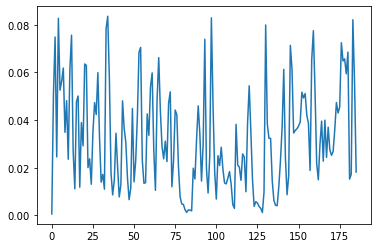

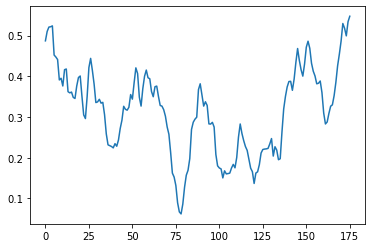

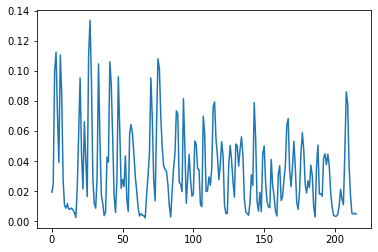

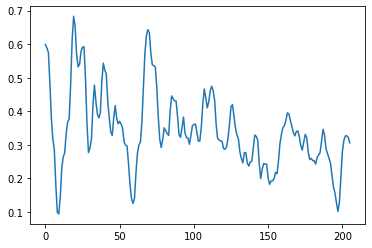

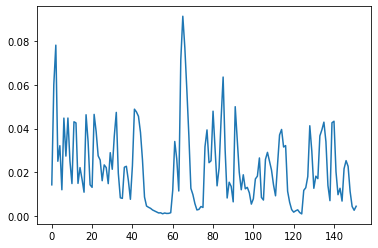

...

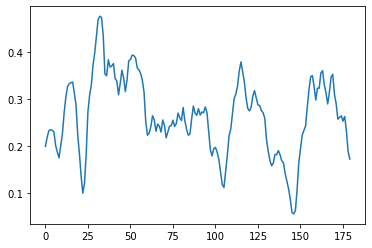

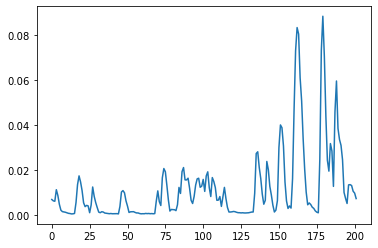

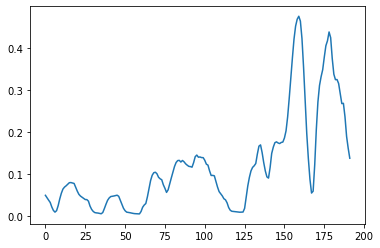

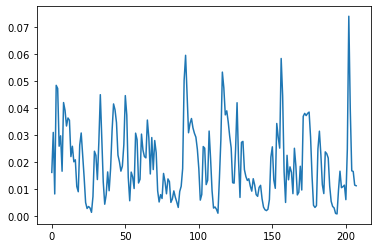

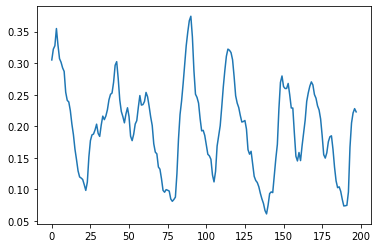

Error in callback <function flush_figures at 0x000001F13FDD4670> (for post_execute):


KeyboardInterrupt: 

In [2]:
df = pd.DataFrame(columns = ['Spine_RMS_Distance_Score', 'Spine1_RMS_Distance_Score', 'Spine2_RMS_Distance_Score', 
                             'Spine3_RMS_Distance_Score', 'LeftShoulder_RMS_Distance_Score', 'LeftArm_RMS_Distance_Score', 
                             'LeftForeArm_RMS_Distance_Score', 'LeftHand_RMS_Distance_Score', 
                             'RightShoulder_RMS_Distance_Score', 'RightArm_RMS_Distance_Score', 
                             'RightForeArm_RMS_Distance_Score', 'RightHand_RMS_Distance_Score', 'Neck_RMS_Distance_Score', 
                             'Neck1_RMS_Distance_Score', 'Head_RMS_Distance_Score'])
Conds = ['Cond_BA']

for cond in Conds:
    for n in range(0,10):
        for i in range(1,81):
            studyseq_idx = (n*80)+i
            audio_idx = i
            print(cond, audio_idx, studyseq_idx)
            studyseq_motion_path = "../" + cond + "/joint_distances_between_frames/" + "StudySeq" + str(i) + ".csv"
            studyseq_motion = pd.read_csv(studyseq_motion_path).iloc[:,1:] # Drop the first column as it is indexing

            studyseq_audio_path = "StudySeq" + str(i) + ".wav"
            studyseq_audio, sr = librosa.load(studyseq_audio_path, sr=44100)

            frame_length = 2205 # Samples Per Frame = Sample Rate / FPS = 44100 / 20 = 2205
            hop_length = 2205

            studyseq_rms = librosa.feature.rms(studyseq_audio, hop_length=hop_length, frame_length=frame_length, center=False)[0]

            plt.figure()
            plt.plot(np.arange(0, len(studyseq_rms)), studyseq_rms)

            # Need to do a check for the Studyseqs of Cond_M since some of the videos have 1 additional frame.
            num_of_frames_motion = studyseq_motion.shape[0] + 1
            num_of_frames_audio = np.size(studyseq_rms)
            window_length = 10 # for windowing
            if (cond == 'Cond_M' and num_of_frames_motion == num_of_frames_audio + 1):
                # If the Cond_M studyseq has an additional frame dont discard the last frame of audio:
                studyseq_motion_array = studyseq_motion.to_numpy()
                windowed_motion = np.asarray([sum(studyseq_motion_array[x:x+window_length]) for x in range(0,len(studyseq_motion_array) - window_length + 1)])

                windowed_audio = np.asarray([sum(studyseq_rms[x:x+window_length]) for x in range(0,len(studyseq_rms) - window_length + 1)])
                windowed_audio = np.tile(np.reshape(windowed_audio, (np.shape(windowed_audio)[0],1)), (1,np.shape(windowed_motion)[1]))
                print(np.shape(windowed_audio), np.shape(windowed_motion))
                studyseq_weighted_motion = np.mean(windowed_motion * windowed_audio, axis=0)
            else:
                # Weighting the joint distances between frames with the rms energy
                studyseq_motion_array = studyseq_motion.to_numpy()
                windowed_motion = np.asarray([sum(studyseq_motion_array[x:x+window_length]) for x in range(0,len(studyseq_motion_array) - window_length + 1)])

                studyseq_rms = studyseq_rms[:-1]
                windowed_audio = np.asarray([sum(studyseq_rms[x:x+window_length]) for x in range(0,len(studyseq_rms) - window_length + 1)])
                plt.figure()
                plt.plot(np.arange(0, len(windowed_audio)), windowed_audio)
                windowed_audio = np.tile(np.reshape(windowed_audio, (np.shape(windowed_audio)[0],1)), (1,np.shape(windowed_motion)[1]))
                studyseq_weighted_motion = np.mean(windowed_motion * windowed_audio, axis=0)


            # Adding Studyseq and Score to a dataframe
            idx = [x[:x.index("_")] + "_RMS_Distance_Score" for x in studyseq_motion.columns]
            rms_distance_series = pd.Series(data=studyseq_weighted_motion, index=idx, name=cond + "/StudySeq" + str(i))
            df = df.append(rms_distance_series)

In [39]:
test

,A,B
0,1,2
1,2,3
2,3,4
3,4,5
4,5,6
5,6,7


# Computing Mean/Max/Min RMS Energy

In [5]:
df_rows = []

for i in range(1,81):
    studyseq_path = "StudySeq" + str(i) + ".wav"
    studyseq, sr = librosa.load(studyseq_path, sr=44100)
    frame_length = 2205 # Samples Per Frame = Sample Rate / FPS = 44100 / 20 = 2205
    hop_length = 2205
    
    studyseq_rms = librosa.feature.rms(studyseq, hop_length=hop_length, frame_length=frame_length, center=False)[0]
    studyseq_rms = studyseq_rms[:-1] # Discard last value as it doesnt affect the score
    
    windowed_audio = np.asarray([sum(studyseq_rms[x:x+window_length]) for x in range(0,len(studyseq_rms) - window_length + 1)])
    
    df_rows = df_rows + [['StudySeq' + str(i), np.min(windowed_audio), np.max(windowed_audio), np.mean(windowed_audio)]]
    print(np.size(windowed_audio))
df_rms = pd.DataFrame(df_rows, columns=['StudySeq', 'min_RMS_Energy', 'max_RMS_Energy', 'mean_RMS_Energy'])
write_path = "../Appropriateness_Features/RMS_Energy_properties.csv"
df_rms.to_csv(write_path)

176
206
142
160
178
192
190
190
186
186
186
228
158
226
182
244
184
240
238
218
212
148
180
192
210
196
158
178
204
212
160
208
180
192
198
202
202
138
180
134
176
206
142
160
178
192
190
190
186
186
186
228
158
226
182
244
184
240
238
218
212
148
180
192
210
196
158
178
204
212
160
208
180
192
198
202
202
138
180
134


# Computing Scores using Finite Differences

In [9]:
df = pd.DataFrame(columns = ['Spine_RMS_Distance_Score', 'Spine1_RMS_Distance_Score', 'Spine2_RMS_Distance_Score', 
                             'Spine3_RMS_Distance_Score', 'LeftShoulder_RMS_Distance_Score', 'LeftArm_RMS_Distance_Score', 
                             'LeftForeArm_RMS_Distance_Score', 'LeftHand_RMS_Distance_Score', 
                             'RightShoulder_RMS_Distance_Score', 'RightArm_RMS_Distance_Score', 
                             'RightForeArm_RMS_Distance_Score', 'RightHand_RMS_Distance_Score', 'Neck_RMS_Distance_Score', 
                             'Neck1_RMS_Distance_Score', 'Head_RMS_Distance_Score'])
Conds = ['Cond_BA', 'Cond_BT', 'Cond_N', 'Cond_M', 'Cond_SA', 'Cond_SB', 'Cond_SC', 'Cond_SD', 'Cond_SE']

for cond in Conds:
    for n in range(0,10):
        for i in range(1,81):
            studyseq_idx = (n*80)+i
            audio_idx = i
            print(cond, audio_idx, studyseq_idx)

            studyseq_motion_path = "../" + cond + "/motion_coords/" + "StudySeq" + str(i) + "_joint_coords.csv"
            studyseq_motion = pd.read_csv(studyseq_motion_path)

            studyseq_audio_path = "StudySeq" + str(audio_idx) + ".wav"
            studyseq_audio, sr = librosa.load(studyseq_audio_path, sr=44100)

            frame_length = 2205 # Samples Per Frame = Sample Rate / FPS = 44100 / 20 = 2205
            hop_length = 2205

            studyseq_rms = librosa.feature.rms(studyseq_audio, hop_length=hop_length, frame_length=frame_length, center=False)[0]

            # Need to do a check for the Studyseqs of Cond_M since some of the videos have 1 additional frame.
            num_of_frames_motion = studyseq_motion.shape[0]
            num_of_frames_audio = np.size(studyseq_rms)
            print(num_of_frames_motion, num_of_frames_audio)
            h = 2 # h where f'(x) ~= f(x+h/2)-f(x-h/2), h must be even and >0
            if (cond == 'Cond_M' and num_of_frames_motion == num_of_frames_audio + 1):
                studyseq_motion = studyseq_motion.iloc[:-1,:]
                fd_audio = []
                fd_motion = []
                for j in range(int(h/2),len(studyseq_rms)-int(h/2)):
                    motion_finite_difference = studyseq_motion.iloc[int(j+h/2),:].values - studyseq_motion.iloc[int(j-h/2),:].values
                    # convert to distance
                    motion_finite_difference = [x**2 for x in motion_finite_difference] 
                    motion_finite_difference = [sum(motion_finite_difference[i:i+3]) for i in range(0, len(motion_finite_difference), 3)]
                    motion_finite_difference = [np.sqrt(x)/h for x in motion_finite_difference]
                    fd_motion = fd_motion + [motion_finite_difference]
                    audio_finite_difference = studyseq_rms[int(j+h/2)] - studyseq_rms[int(j-h/2)]    
                    fd_audio = fd_audio + [audio_finite_difference/h]
            else:
                # Weighting the joint distances between frames with the rms energy
                fd_audio = []
                fd_motion = []
                for j in range(int(h/2),len(studyseq_rms)-int(h/2)):
                    motion_finite_difference = studyseq_motion.iloc[int(j+h/2),:].values - studyseq_motion.iloc[int(j-h/2),:].values
                    motion_finite_difference = [x**2 for x in motion_finite_difference] 
                    motion_finite_difference = [sum(motion_finite_difference[i:i+3]) for i in range(0, len(motion_finite_difference), 3)]
                    motion_finite_difference = [np.sqrt(x)/h for x in motion_finite_difference]
                    fd_motion = fd_motion + [motion_finite_difference]
                    audio_finite_difference = studyseq_rms[int(j+h/2)] - studyseq_rms[int(j-h/2)]    
                    fd_audio = fd_audio + [audio_finite_difference/h]
                    
            motion_forward_difference = studyseq_motion.iloc[1].values - studyseq_motion.iloc[0].values
            motion_forward_difference = [x**2 for x in motion_forward_difference]
            motion_forward_difference = [sum(motion_forward_difference[i:i+3]) for i in range(0, len(motion_forward_difference), 3)] 

            motion_backward_difference = studyseq_motion.iloc[-1].values - studyseq_motion.iloc[-2].values
            motion_backward_difference = [x**2 for x in motion_backward_difference]
            motion_backward_difference = [sum(motion_backward_difference[i:i+3]) for i in range(0, len(motion_backward_difference), 3)]

            fd_motion = [motion_forward_difference] + fd_motion + [motion_backward_difference]

            audio_forward_difference = (studyseq_rms[1] - studyseq_rms[0])
            audio_backward_difference = (studyseq_rms[-1] - studyseq_rms[-2])
            fd_audio = [audio_forward_difference] + fd_audio + [audio_backward_difference]
                
            
            fd_motion = np.asarray(fd_motion)
            fd_audio = np.asarray(fd_audio)
            studyseq_weighted_motion = np.mean(np.multiply(fd_motion,np.expand_dims(fd_audio, axis=1)), axis=0)

            #plt.plot(np.arange(0, len(studyseq_rms)-h), fd_audio)
            #plt.figure()
            #plt.plot(np.arange(0, len(studyseq_rms)), studyseq_rms)
            #plt.figure()
            #print(np.shape(fd_audio), np.shape(studyseq_rms), np.shape(fd_motion))

            idx = ['Spine_RMS_Distance_Score', 'Spine1_RMS_Distance_Score', 'Spine2_RMS_Distance_Score', 
                     'Spine3_RMS_Distance_Score', 'LeftShoulder_RMS_Distance_Score', 'LeftArm_RMS_Distance_Score', 
                     'LeftForeArm_RMS_Distance_Score', 'LeftHand_RMS_Distance_Score', 
                     'RightShoulder_RMS_Distance_Score', 'RightArm_RMS_Distance_Score', 
                     'RightForeArm_RMS_Distance_Score', 'RightHand_RMS_Distance_Score', 'Neck_RMS_Distance_Score', 
                     'Neck1_RMS_Distance_Score', 'Head_RMS_Distance_Score']
            rms_distance_series = pd.Series(data=studyseq_weighted_motion, index=idx, name=cond + "/StudySeq" + str(studyseq_idx))
            df = df.append(rms_distance_series)


write_path = "../Appropriateness_Features/RMS_Distance_scores_fd.csv"
df.to_csv(write_path)
print(df)

df = (df - np.min(df))/(np.max(df) - np.min(df))
df = df + 0.01 # add 0.01 to scale to [1,2] instead of [0,1]
print(df)
write_path = "../Appropriateness_Features/RMS_Distance_scores_fd_scaled.csv"
df.to_csv(write_path)

Cond_BA 1 1
186 186
Cond_BA 2 2
216 216
Cond_BA 3 3
152 152
Cond_BA 4 4
170 170
Cond_BA 5 5
188 188
Cond_BA 6 6
202 202
Cond_BA 7 7
200 200
Cond_BA 8 8
200 200
Cond_BA 9 9
196 196
Cond_BA 10 10
196 196
Cond_BA 11 11
196 196
Cond_BA 12 12
238 238
Cond_BA 13 13
168 168
Cond_BA 14 14
236 236
Cond_BA 15 15
192 192
Cond_BA 16 16
254 254
Cond_BA 17 17
194 194
Cond_BA 18 18
250 250
Cond_BA 19 19
248 248
Cond_BA 20 20
228 228
Cond_BA 21 21
222 222
Cond_BA 22 22
158 158
Cond_BA 23 23
190 190
Cond_BA 24 24
202 202
Cond_BA 25 25
220 220
Cond_BA 26 26
206 206
Cond_BA 27 27
168 168
Cond_BA 28 28
188 188
Cond_BA 29 29
214 214
Cond_BA 30 30
222 222
Cond_BA 31 31
170 170
Cond_BA 32 32
218 218
Cond_BA 33 33
190 190
Cond_BA 34 34
202 202
Cond_BA 35 35
208 208
Cond_BA 36 36
212 212
Cond_BA 37 37
212 212
Cond_BA 38 38
148 148
Cond_BA 39 39
190 190
Cond_BA 40 40
144 144
Cond_BA 41 41
186 186
Cond_BA 42 42
216 216
Cond_BA 43 43
152 152
Cond_BA 44 44
170 170
Cond_BA 45 45
188 188
Cond_BA 46 46
202 202
Cond_B

Cond_BA 45 365
188 188
Cond_BA 46 366
202 202
Cond_BA 47 367
200 200
Cond_BA 48 368
200 200
Cond_BA 49 369
196 196
Cond_BA 50 370
196 196
Cond_BA 51 371
196 196
Cond_BA 52 372
238 238
Cond_BA 53 373
168 168
Cond_BA 54 374
236 236
Cond_BA 55 375
192 192
Cond_BA 56 376
254 254
Cond_BA 57 377
194 194
Cond_BA 58 378
250 250
Cond_BA 59 379
248 248
Cond_BA 60 380
228 228
Cond_BA 61 381
222 222
Cond_BA 62 382
158 158
Cond_BA 63 383
190 190
Cond_BA 64 384
202 202
Cond_BA 65 385
220 220
Cond_BA 66 386
206 206
Cond_BA 67 387
168 168
Cond_BA 68 388
188 188
Cond_BA 69 389
214 214
Cond_BA 70 390
222 222
Cond_BA 71 391
170 170
Cond_BA 72 392
218 218
Cond_BA 73 393
190 190
Cond_BA 74 394
202 202
Cond_BA 75 395
208 208
Cond_BA 76 396
212 212
Cond_BA 77 397
212 212
Cond_BA 78 398
148 148
Cond_BA 79 399
190 190
Cond_BA 80 400
144 144
Cond_BA 1 401
186 186
Cond_BA 2 402
216 216
Cond_BA 3 403
152 152
Cond_BA 4 404
170 170
Cond_BA 5 405
188 188
Cond_BA 6 406
202 202
Cond_BA 7 407
200 200
Cond_BA 8 408
200 

Cond_BA 3 723
152 152
Cond_BA 4 724
170 170
Cond_BA 5 725
188 188
Cond_BA 6 726
202 202
Cond_BA 7 727
200 200
Cond_BA 8 728
200 200
Cond_BA 9 729
196 196
Cond_BA 10 730
196 196
Cond_BA 11 731
196 196
Cond_BA 12 732
238 238
Cond_BA 13 733
168 168
Cond_BA 14 734
236 236
Cond_BA 15 735
192 192
Cond_BA 16 736
254 254
Cond_BA 17 737
194 194
Cond_BA 18 738
250 250
Cond_BA 19 739
248 248
Cond_BA 20 740
228 228
Cond_BA 21 741
222 222
Cond_BA 22 742
158 158
Cond_BA 23 743
190 190
Cond_BA 24 744
202 202
Cond_BA 25 745
220 220
Cond_BA 26 746
206 206
Cond_BA 27 747
168 168
Cond_BA 28 748
188 188
Cond_BA 29 749
214 214
Cond_BA 30 750
222 222
Cond_BA 31 751
170 170
Cond_BA 32 752
218 218
Cond_BA 33 753
190 190
Cond_BA 34 754
202 202
Cond_BA 35 755
208 208
Cond_BA 36 756
212 212
Cond_BA 37 757
212 212
Cond_BA 38 758
148 148
Cond_BA 39 759
190 190
Cond_BA 40 760
144 144
Cond_BA 41 761
186 186
Cond_BA 42 762
216 216
Cond_BA 43 763
152 152
Cond_BA 44 764
170 170
Cond_BA 45 765
188 188
Cond_BA 46 766
202

Cond_BT 46 286
202 202
Cond_BT 47 287
200 200
Cond_BT 48 288
200 200
Cond_BT 49 289
196 196
Cond_BT 50 290
196 196
Cond_BT 51 291
196 196
Cond_BT 52 292
238 238
Cond_BT 53 293
168 168
Cond_BT 54 294
236 236
Cond_BT 55 295
192 192
Cond_BT 56 296
254 254
Cond_BT 57 297
194 194
Cond_BT 58 298
250 250
Cond_BT 59 299
248 248
Cond_BT 60 300
228 228
Cond_BT 61 301
222 222
Cond_BT 62 302
158 158
Cond_BT 63 303
190 190
Cond_BT 64 304
202 202
Cond_BT 65 305
220 220
Cond_BT 66 306
206 206
Cond_BT 67 307
168 168
Cond_BT 68 308
188 188
Cond_BT 69 309
214 214
Cond_BT 70 310
222 222
Cond_BT 71 311
170 170
Cond_BT 72 312
218 218
Cond_BT 73 313
190 190
Cond_BT 74 314
202 202
Cond_BT 75 315
208 208
Cond_BT 76 316
212 212
Cond_BT 77 317
212 212
Cond_BT 78 318
148 148
Cond_BT 79 319
190 190
Cond_BT 80 320
144 144
Cond_BT 1 321
186 186
Cond_BT 2 322
216 216
Cond_BT 3 323
152 152
Cond_BT 4 324
170 170
Cond_BT 5 325
188 188
Cond_BT 6 326
202 202
Cond_BT 7 327
200 200
Cond_BT 8 328
200 200
Cond_BT 9 329
196 1

Cond_BT 5 645
188 188
Cond_BT 6 646
202 202
Cond_BT 7 647
200 200
Cond_BT 8 648
200 200
Cond_BT 9 649
196 196
Cond_BT 10 650
196 196
Cond_BT 11 651
196 196
Cond_BT 12 652
238 238
Cond_BT 13 653
168 168
Cond_BT 14 654
236 236
Cond_BT 15 655
192 192
Cond_BT 16 656
254 254
Cond_BT 17 657
194 194
Cond_BT 18 658
250 250
Cond_BT 19 659
248 248
Cond_BT 20 660
228 228
Cond_BT 21 661
222 222
Cond_BT 22 662
158 158
Cond_BT 23 663
190 190
Cond_BT 24 664
202 202
Cond_BT 25 665
220 220
Cond_BT 26 666
206 206
Cond_BT 27 667
168 168
Cond_BT 28 668
188 188
Cond_BT 29 669
214 214
Cond_BT 30 670
222 222
Cond_BT 31 671
170 170
Cond_BT 32 672
218 218
Cond_BT 33 673
190 190
Cond_BT 34 674
202 202
Cond_BT 35 675
208 208
Cond_BT 36 676
212 212
Cond_BT 37 677
212 212
Cond_BT 38 678
148 148
Cond_BT 39 679
190 190
Cond_BT 40 680
144 144
Cond_BT 41 681
186 186
Cond_BT 42 682
216 216
Cond_BT 43 683
152 152
Cond_BT 44 684
170 170
Cond_BT 45 685
188 188
Cond_BT 46 686
202 202
Cond_BT 47 687
200 200
Cond_BT 48 688
2

Cond_N 59 219
248 248
Cond_N 60 220
228 228
Cond_N 61 221
222 222
Cond_N 62 222
158 158
Cond_N 63 223
190 190
Cond_N 64 224
202 202
Cond_N 65 225
220 220
Cond_N 66 226
206 206
Cond_N 67 227
168 168
Cond_N 68 228
188 188
Cond_N 69 229
214 214
Cond_N 70 230
222 222
Cond_N 71 231
170 170
Cond_N 72 232
218 218
Cond_N 73 233
190 190
Cond_N 74 234
202 202
Cond_N 75 235
208 208
Cond_N 76 236
212 212
Cond_N 77 237
212 212
Cond_N 78 238
148 148
Cond_N 79 239
190 190
Cond_N 80 240
144 144
Cond_N 1 241
186 186
Cond_N 2 242
216 216
Cond_N 3 243
152 152
Cond_N 4 244
170 170
Cond_N 5 245
188 188
Cond_N 6 246
202 202
Cond_N 7 247
200 200
Cond_N 8 248
200 200
Cond_N 9 249
196 196
Cond_N 10 250
196 196
Cond_N 11 251
196 196
Cond_N 12 252
238 238
Cond_N 13 253
168 168
Cond_N 14 254
236 236
Cond_N 15 255
192 192
Cond_N 16 256
254 254
Cond_N 17 257
194 194
Cond_N 18 258
250 250
Cond_N 19 259
248 248
Cond_N 20 260
228 228
Cond_N 21 261
222 222
Cond_N 22 262
158 158
Cond_N 23 263
190 190
Cond_N 24 264
202 2

Cond_N 35 595
208 208
Cond_N 36 596
212 212
Cond_N 37 597
212 212
Cond_N 38 598
148 148
Cond_N 39 599
190 190
Cond_N 40 600
144 144
Cond_N 41 601
186 186
Cond_N 42 602
216 216
Cond_N 43 603
152 152
Cond_N 44 604
170 170
Cond_N 45 605
188 188
Cond_N 46 606
202 202
Cond_N 47 607
200 200
Cond_N 48 608
200 200
Cond_N 49 609
196 196
Cond_N 50 610
196 196
Cond_N 51 611
196 196
Cond_N 52 612
238 238
Cond_N 53 613
168 168
Cond_N 54 614
236 236
Cond_N 55 615
192 192
Cond_N 56 616
254 254
Cond_N 57 617
194 194
Cond_N 58 618
250 250
Cond_N 59 619
248 248
Cond_N 60 620
228 228
Cond_N 61 621
222 222
Cond_N 62 622
158 158
Cond_N 63 623
190 190
Cond_N 64 624
202 202
Cond_N 65 625
220 220
Cond_N 66 626
206 206
Cond_N 67 627
168 168
Cond_N 68 628
188 188
Cond_N 69 629
214 214
Cond_N 70 630
222 222
Cond_N 71 631
170 170
Cond_N 72 632
218 218
Cond_N 73 633
190 190
Cond_N 74 634
202 202
Cond_N 75 635
208 208
Cond_N 76 636
212 212
Cond_N 77 637
212 212
Cond_N 78 638
148 148
Cond_N 79 639
190 190
Cond_N 80 

Cond_M 16 176
255 254
Cond_M 17 177
195 194
Cond_M 18 178
250 250
Cond_M 19 179
249 248
Cond_M 20 180
229 228
Cond_M 21 181
223 222
Cond_M 22 182
159 158
Cond_M 23 183
191 190
Cond_M 24 184
203 202
Cond_M 25 185
221 220
Cond_M 26 186
207 206
Cond_M 27 187
169 168
Cond_M 28 188
189 188
Cond_M 29 189
215 214
Cond_M 30 190
223 222
Cond_M 31 191
171 170
Cond_M 32 192
218 218
Cond_M 33 193
191 190
Cond_M 34 194
203 202
Cond_M 35 195
209 208
Cond_M 36 196
212 212
Cond_M 37 197
212 212
Cond_M 38 198
148 148
Cond_M 39 199
191 190
Cond_M 40 200
145 144
Cond_M 41 201
186 186
Cond_M 42 202
217 216
Cond_M 43 203
153 152
Cond_M 44 204
171 170
Cond_M 45 205
189 188
Cond_M 46 206
203 202
Cond_M 47 207
201 200
Cond_M 48 208
201 200
Cond_M 49 209
197 196
Cond_M 50 210
197 196
Cond_M 51 211
197 196
Cond_M 52 212
239 238
Cond_M 53 213
169 168
Cond_M 54 214
237 236
Cond_M 55 215
192 192
Cond_M 56 216
255 254
Cond_M 57 217
195 194
Cond_M 58 218
250 250
Cond_M 59 219
249 248
Cond_M 60 220
229 228
Cond_M 61 

Cond_M 73 553
191 190
Cond_M 74 554
203 202
Cond_M 75 555
209 208
Cond_M 76 556
212 212
Cond_M 77 557
212 212
Cond_M 78 558
148 148
Cond_M 79 559
191 190
Cond_M 80 560
145 144
Cond_M 1 561
186 186
Cond_M 2 562
217 216
Cond_M 3 563
153 152
Cond_M 4 564
171 170
Cond_M 5 565
189 188
Cond_M 6 566
203 202
Cond_M 7 567
201 200
Cond_M 8 568
201 200
Cond_M 9 569
197 196
Cond_M 10 570
197 196
Cond_M 11 571
197 196
Cond_M 12 572
239 238
Cond_M 13 573
169 168
Cond_M 14 574
237 236
Cond_M 15 575
192 192
Cond_M 16 576
255 254
Cond_M 17 577
195 194
Cond_M 18 578
250 250
Cond_M 19 579
249 248
Cond_M 20 580
229 228
Cond_M 21 581
223 222
Cond_M 22 582
159 158
Cond_M 23 583
191 190
Cond_M 24 584
203 202
Cond_M 25 585
221 220
Cond_M 26 586
207 206
Cond_M 27 587
169 168
Cond_M 28 588
189 188
Cond_M 29 589
215 214
Cond_M 30 590
223 222
Cond_M 31 591
171 170
Cond_M 32 592
218 218
Cond_M 33 593
191 190
Cond_M 34 594
203 202
Cond_M 35 595
209 208
Cond_M 36 596
212 212
Cond_M 37 597
212 212
Cond_M 38 598
148 1

Cond_SA 49 129
196 196
Cond_SA 50 130
196 196
Cond_SA 51 131
196 196
Cond_SA 52 132
238 238
Cond_SA 53 133
168 168
Cond_SA 54 134
236 236
Cond_SA 55 135
192 192
Cond_SA 56 136
254 254
Cond_SA 57 137
194 194
Cond_SA 58 138
250 250
Cond_SA 59 139
248 248
Cond_SA 60 140
228 228
Cond_SA 61 141
222 222
Cond_SA 62 142
158 158
Cond_SA 63 143
190 190
Cond_SA 64 144
202 202
Cond_SA 65 145
220 220
Cond_SA 66 146
206 206
Cond_SA 67 147
168 168
Cond_SA 68 148
188 188
Cond_SA 69 149
214 214
Cond_SA 70 150
222 222
Cond_SA 71 151
170 170
Cond_SA 72 152
218 218
Cond_SA 73 153
190 190
Cond_SA 74 154
202 202
Cond_SA 75 155
208 208
Cond_SA 76 156
212 212
Cond_SA 77 157
212 212
Cond_SA 78 158
148 148
Cond_SA 79 159
190 190
Cond_SA 80 160
144 144
Cond_SA 1 161
186 186
Cond_SA 2 162
216 216
Cond_SA 3 163
152 152
Cond_SA 4 164
170 170
Cond_SA 5 165
188 188
Cond_SA 6 166
202 202
Cond_SA 7 167
200 200
Cond_SA 8 168
200 200
Cond_SA 9 169
196 196
Cond_SA 10 170
196 196
Cond_SA 11 171
196 196
Cond_SA 12 172
238 2

Cond_SA 9 489
196 196
Cond_SA 10 490
196 196
Cond_SA 11 491
196 196
Cond_SA 12 492
238 238
Cond_SA 13 493
168 168
Cond_SA 14 494
236 236
Cond_SA 15 495
192 192
Cond_SA 16 496
254 254
Cond_SA 17 497
194 194
Cond_SA 18 498
250 250
Cond_SA 19 499
248 248
Cond_SA 20 500
228 228
Cond_SA 21 501
222 222
Cond_SA 22 502
158 158
Cond_SA 23 503
190 190
Cond_SA 24 504
202 202
Cond_SA 25 505
220 220
Cond_SA 26 506
206 206
Cond_SA 27 507
168 168
Cond_SA 28 508
188 188
Cond_SA 29 509
214 214
Cond_SA 30 510
222 222
Cond_SA 31 511
170 170
Cond_SA 32 512
218 218
Cond_SA 33 513
190 190
Cond_SA 34 514
202 202
Cond_SA 35 515
208 208
Cond_SA 36 516
212 212
Cond_SA 37 517
212 212
Cond_SA 38 518
148 148
Cond_SA 39 519
190 190
Cond_SA 40 520
144 144
Cond_SA 41 521
186 186
Cond_SA 42 522
216 216
Cond_SA 43 523
152 152
Cond_SA 44 524
170 170
Cond_SA 45 525
188 188
Cond_SA 46 526
202 202
Cond_SA 47 527
200 200
Cond_SA 48 528
200 200
Cond_SA 49 529
196 196
Cond_SA 50 530
196 196
Cond_SA 51 531
196 196
Cond_SA 52 5

Cond_SB 50 50
196 196
Cond_SB 51 51
196 196
Cond_SB 52 52
238 238
Cond_SB 53 53
168 168
Cond_SB 54 54
236 236
Cond_SB 55 55
192 192
Cond_SB 56 56
254 254
Cond_SB 57 57
194 194
Cond_SB 58 58
250 250
Cond_SB 59 59
248 248
Cond_SB 60 60
228 228
Cond_SB 61 61
222 222
Cond_SB 62 62
158 158
Cond_SB 63 63
190 190
Cond_SB 64 64
202 202
Cond_SB 65 65
220 220
Cond_SB 66 66
206 206
Cond_SB 67 67
168 168
Cond_SB 68 68
188 188
Cond_SB 69 69
214 214
Cond_SB 70 70
222 222
Cond_SB 71 71
170 170
Cond_SB 72 72
218 218
Cond_SB 73 73
190 190
Cond_SB 74 74
202 202
Cond_SB 75 75
208 208
Cond_SB 76 76
212 212
Cond_SB 77 77
212 212
Cond_SB 78 78
148 148
Cond_SB 79 79
190 190
Cond_SB 80 80
144 144
Cond_SB 1 81
186 186
Cond_SB 2 82
216 216
Cond_SB 3 83
152 152
Cond_SB 4 84
170 170
Cond_SB 5 85
188 188
Cond_SB 6 86
202 202
Cond_SB 7 87
200 200
Cond_SB 8 88
200 200
Cond_SB 9 89
196 196
Cond_SB 10 90
196 196
Cond_SB 11 91
196 196
Cond_SB 12 92
238 238
Cond_SB 13 93
168 168
Cond_SB 14 94
236 236
Cond_SB 15 95
192 1

Cond_SB 13 413
168 168
Cond_SB 14 414
236 236
Cond_SB 15 415
192 192
Cond_SB 16 416
254 254
Cond_SB 17 417
194 194
Cond_SB 18 418
250 250
Cond_SB 19 419
248 248
Cond_SB 20 420
228 228
Cond_SB 21 421
222 222
Cond_SB 22 422
158 158
Cond_SB 23 423
190 190
Cond_SB 24 424
202 202
Cond_SB 25 425
220 220
Cond_SB 26 426
206 206
Cond_SB 27 427
168 168
Cond_SB 28 428
188 188
Cond_SB 29 429
214 214
Cond_SB 30 430
222 222
Cond_SB 31 431
170 170
Cond_SB 32 432
218 218
Cond_SB 33 433
190 190
Cond_SB 34 434
202 202
Cond_SB 35 435
208 208
Cond_SB 36 436
212 212
Cond_SB 37 437
212 212
Cond_SB 38 438
148 148
Cond_SB 39 439
190 190
Cond_SB 40 440
144 144
Cond_SB 41 441
186 186
Cond_SB 42 442
216 216
Cond_SB 43 443
152 152
Cond_SB 44 444
170 170
Cond_SB 45 445
188 188
Cond_SB 46 446
202 202
Cond_SB 47 447
200 200
Cond_SB 48 448
200 200
Cond_SB 49 449
196 196
Cond_SB 50 450
196 196
Cond_SB 51 451
196 196
Cond_SB 52 452
238 238
Cond_SB 53 453
168 168
Cond_SB 54 454
236 236
Cond_SB 55 455
192 192
Cond_SB 56 

Cond_SB 52 772
238 238
Cond_SB 53 773
168 168
Cond_SB 54 774
236 236
Cond_SB 55 775
192 192
Cond_SB 56 776
254 254
Cond_SB 57 777
194 194
Cond_SB 58 778
250 250
Cond_SB 59 779
248 248
Cond_SB 60 780
228 228
Cond_SB 61 781
222 222
Cond_SB 62 782
158 158
Cond_SB 63 783
190 190
Cond_SB 64 784
202 202
Cond_SB 65 785
220 220
Cond_SB 66 786
206 206
Cond_SB 67 787
168 168
Cond_SB 68 788
188 188
Cond_SB 69 789
214 214
Cond_SB 70 790
222 222
Cond_SB 71 791
170 170
Cond_SB 72 792
218 218
Cond_SB 73 793
190 190
Cond_SB 74 794
202 202
Cond_SB 75 795
208 208
Cond_SB 76 796
212 212
Cond_SB 77 797
212 212
Cond_SB 78 798
148 148
Cond_SB 79 799
190 190
Cond_SB 80 800
144 144
Cond_SC 1 1
186 186
Cond_SC 2 2
216 216
Cond_SC 3 3
152 152
Cond_SC 4 4
170 170
Cond_SC 5 5
188 188
Cond_SC 6 6
202 202
Cond_SC 7 7
200 200
Cond_SC 8 8
200 200
Cond_SC 9 9
196 196
Cond_SC 10 10
196 196
Cond_SC 11 11
196 196
Cond_SC 12 12
238 238
Cond_SC 13 13
168 168
Cond_SC 14 14
236 236
Cond_SC 15 15
192 192
Cond_SC 16 16
254 254

Cond_SC 16 336
254 254
Cond_SC 17 337
194 194
Cond_SC 18 338
250 250
Cond_SC 19 339
248 248
Cond_SC 20 340
228 228
Cond_SC 21 341
222 222
Cond_SC 22 342
158 158
Cond_SC 23 343
190 190
Cond_SC 24 344
202 202
Cond_SC 25 345
220 220
Cond_SC 26 346
206 206
Cond_SC 27 347
168 168
Cond_SC 28 348
188 188
Cond_SC 29 349
214 214
Cond_SC 30 350
222 222
Cond_SC 31 351
170 170
Cond_SC 32 352
218 218
Cond_SC 33 353
190 190
Cond_SC 34 354
202 202
Cond_SC 35 355
208 208
Cond_SC 36 356
212 212
Cond_SC 37 357
212 212
Cond_SC 38 358
148 148
Cond_SC 39 359
190 190
Cond_SC 40 360
144 144
Cond_SC 41 361
186 186
Cond_SC 42 362
216 216
Cond_SC 43 363
152 152
Cond_SC 44 364
170 170
Cond_SC 45 365
188 188
Cond_SC 46 366
202 202
Cond_SC 47 367
200 200
Cond_SC 48 368
200 200
Cond_SC 49 369
196 196
Cond_SC 50 370
196 196
Cond_SC 51 371
196 196
Cond_SC 52 372
238 238
Cond_SC 53 373
168 168
Cond_SC 54 374
236 236
Cond_SC 55 375
192 192
Cond_SC 56 376
254 254
Cond_SC 57 377
194 194
Cond_SC 58 378
250 250
Cond_SC 59 

Cond_SC 56 696
254 254
Cond_SC 57 697
194 194
Cond_SC 58 698
250 250
Cond_SC 59 699
248 248
Cond_SC 60 700
228 228
Cond_SC 61 701
222 222
Cond_SC 62 702
158 158
Cond_SC 63 703
190 190
Cond_SC 64 704
202 202
Cond_SC 65 705
220 220
Cond_SC 66 706
206 206
Cond_SC 67 707
168 168
Cond_SC 68 708
188 188
Cond_SC 69 709
214 214
Cond_SC 70 710
222 222
Cond_SC 71 711
170 170
Cond_SC 72 712
218 218
Cond_SC 73 713
190 190
Cond_SC 74 714
202 202
Cond_SC 75 715
208 208
Cond_SC 76 716
212 212
Cond_SC 77 717
212 212
Cond_SC 78 718
148 148
Cond_SC 79 719
190 190
Cond_SC 80 720
144 144
Cond_SC 1 721
186 186
Cond_SC 2 722
216 216
Cond_SC 3 723
152 152
Cond_SC 4 724
170 170
Cond_SC 5 725
188 188
Cond_SC 6 726
202 202
Cond_SC 7 727
200 200
Cond_SC 8 728
200 200
Cond_SC 9 729
196 196
Cond_SC 10 730
196 196
Cond_SC 11 731
196 196
Cond_SC 12 732
238 238
Cond_SC 13 733
168 168
Cond_SC 14 734
236 236
Cond_SC 15 735
192 192
Cond_SC 16 736
254 254
Cond_SC 17 737
194 194
Cond_SC 18 738
250 250
Cond_SC 19 739
248 2

248 248
Cond_SD 20 260
228 228
Cond_SD 21 261
222 222
Cond_SD 22 262
158 158
Cond_SD 23 263
190 190
Cond_SD 24 264
202 202
Cond_SD 25 265
220 220
Cond_SD 26 266
206 206
Cond_SD 27 267
168 168
Cond_SD 28 268
188 188
Cond_SD 29 269
214 214
Cond_SD 30 270
222 222
Cond_SD 31 271
170 170
Cond_SD 32 272
218 218
Cond_SD 33 273
190 190
Cond_SD 34 274
202 202
Cond_SD 35 275
208 208
Cond_SD 36 276
212 212
Cond_SD 37 277
212 212
Cond_SD 38 278
148 148
Cond_SD 39 279
190 190
Cond_SD 40 280
144 144
Cond_SD 41 281
186 186
Cond_SD 42 282
216 216
Cond_SD 43 283
152 152
Cond_SD 44 284
170 170
Cond_SD 45 285
188 188
Cond_SD 46 286
202 202
Cond_SD 47 287
200 200
Cond_SD 48 288
200 200
Cond_SD 49 289
196 196
Cond_SD 50 290
196 196
Cond_SD 51 291
196 196
Cond_SD 52 292
238 238
Cond_SD 53 293
168 168
Cond_SD 54 294
236 236
Cond_SD 55 295
192 192
Cond_SD 56 296
254 254
Cond_SD 57 297
194 194
Cond_SD 58 298
250 250
Cond_SD 59 299
248 248
Cond_SD 60 300
228 228
Cond_SD 61 301
222 222
Cond_SD 62 302
158 158
Con

Cond_SD 59 619
248 248
Cond_SD 60 620
228 228
Cond_SD 61 621
222 222
Cond_SD 62 622
158 158
Cond_SD 63 623
190 190
Cond_SD 64 624
202 202
Cond_SD 65 625
220 220
Cond_SD 66 626
206 206
Cond_SD 67 627
168 168
Cond_SD 68 628
188 188
Cond_SD 69 629
214 214
Cond_SD 70 630
222 222
Cond_SD 71 631
170 170
Cond_SD 72 632
218 218
Cond_SD 73 633
190 190
Cond_SD 74 634
202 202
Cond_SD 75 635
208 208
Cond_SD 76 636
212 212
Cond_SD 77 637
212 212
Cond_SD 78 638
148 148
Cond_SD 79 639
190 190
Cond_SD 80 640
144 144
Cond_SD 1 641
186 186
Cond_SD 2 642
216 216
Cond_SD 3 643
152 152
Cond_SD 4 644
170 170
Cond_SD 5 645
188 188
Cond_SD 6 646
202 202
Cond_SD 7 647
200 200
Cond_SD 8 648
200 200
Cond_SD 9 649
196 196
Cond_SD 10 650
196 196
Cond_SD 11 651
196 196
Cond_SD 12 652
238 238
Cond_SD 13 653
168 168
Cond_SD 14 654
236 236
Cond_SD 15 655
192 192
Cond_SD 16 656
254 254
Cond_SD 17 657
194 194
Cond_SD 18 658
250 250
Cond_SD 19 659
248 248
Cond_SD 20 660
228 228
Cond_SD 21 661
222 222
Cond_SD 22 662
158 1

Cond_SE 22 182
158 158
Cond_SE 23 183
190 190
Cond_SE 24 184
202 202
Cond_SE 25 185
220 220
Cond_SE 26 186
206 206
Cond_SE 27 187
168 168
Cond_SE 28 188
188 188
Cond_SE 29 189
214 214
Cond_SE 30 190
222 222
Cond_SE 31 191
170 170
Cond_SE 32 192
218 218
Cond_SE 33 193
190 190
Cond_SE 34 194
202 202
Cond_SE 35 195
208 208
Cond_SE 36 196
212 212
Cond_SE 37 197
212 212
Cond_SE 38 198
148 148
Cond_SE 39 199
190 190
Cond_SE 40 200
144 144
Cond_SE 41 201
186 186
Cond_SE 42 202
216 216
Cond_SE 43 203
152 152
Cond_SE 44 204
170 170
Cond_SE 45 205
188 188
Cond_SE 46 206
202 202
Cond_SE 47 207
200 200
Cond_SE 48 208
200 200
Cond_SE 49 209
196 196
Cond_SE 50 210
196 196
Cond_SE 51 211
196 196
Cond_SE 52 212
238 238
Cond_SE 53 213
168 168
Cond_SE 54 214
236 236
Cond_SE 55 215
192 192
Cond_SE 56 216
254 254
Cond_SE 57 217
194 194
Cond_SE 58 218
250 250
Cond_SE 59 219
248 248
Cond_SE 60 220
228 228
Cond_SE 61 221
222 222
Cond_SE 62 222
158 158
Cond_SE 63 223
190 190
Cond_SE 64 224
202 202
Cond_SE 65 

222 222
Cond_SE 62 542
158 158
Cond_SE 63 543
190 190
Cond_SE 64 544
202 202
Cond_SE 65 545
220 220
Cond_SE 66 546
206 206
Cond_SE 67 547
168 168
Cond_SE 68 548
188 188
Cond_SE 69 549
214 214
Cond_SE 70 550
222 222
Cond_SE 71 551
170 170
Cond_SE 72 552
218 218
Cond_SE 73 553
190 190
Cond_SE 74 554
202 202
Cond_SE 75 555
208 208
Cond_SE 76 556
212 212
Cond_SE 77 557
212 212
Cond_SE 78 558
148 148
Cond_SE 79 559
190 190
Cond_SE 80 560
144 144
Cond_SE 1 561
186 186
Cond_SE 2 562
216 216
Cond_SE 3 563
152 152
Cond_SE 4 564
170 170
Cond_SE 5 565
188 188
Cond_SE 6 566
202 202
Cond_SE 7 567
200 200
Cond_SE 8 568
200 200
Cond_SE 9 569
196 196
Cond_SE 10 570
196 196
Cond_SE 11 571
196 196
Cond_SE 12 572
238 238
Cond_SE 13 573
168 168
Cond_SE 14 574
236 236
Cond_SE 15 575
192 192
Cond_SE 16 576
254 254
Cond_SE 17 577
194 194
Cond_SE 18 578
250 250
Cond_SE 19 579
248 248
Cond_SE 20 580
228 228
Cond_SE 21 581
222 222
Cond_SE 22 582
158 158
Cond_SE 23 583
190 190
Cond_SE 24 584
202 202
Cond_SE 25 5

In [6]:
df.describe()

,Spine_RMS_Distance_Score,Spine1_RMS_Distance_Score,Spine2_RMS_Distance_Score,Spine3_RMS_Distance_Score,LeftShoulder_RMS_Distance_Score,LeftArm_RMS_Distance_Score,LeftForeArm_RMS_Distance_Score,LeftHand_RMS_Distance_Score,RightShoulder_RMS_Distance_Score,RightArm_RMS_Distance_Score,RightForeArm_RMS_Distance_Score,RightHand_RMS_Distance_Score,Neck_RMS_Distance_Score,Neck1_RMS_Distance_Score,Head_RMS_Distance_Score
count,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000
mean,1.390230,1.387120,1.373964,1.361423,1.337093,1.393761,1.671338,1.513751,1.337153,1.403842,1.471362,1.490046,1.341468,1.346025,1.364037
std,0.072824,0.073263,0.074471,0.077927,0.082507,0.079778,0.098200,0.122104,0.082510,0.090691,0.106151,0.139742,0.085453,0.088945,0.092563
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.389385,1.379225,1.358815,1.338095,1.308145,1.367481,1.621650,1.445389,1.308172,1.378409,1.429464,1.418816,1.307984,1.310448,1.326000
50%,1.391520,1.387225,1.373771,1.360443,1.336779,1.393462,1.672037,1.509189,1.336845,1.403662,1.474126,1.487070,1.340897,1.344891,1.361860
75%,1.391806,1.395375,1.388365,1.383205,1.363792,1.420304,1.720810,1.571250,1.363865,1.436741,1.516052,1.562356,1.371201,1.380062,1.397126
max,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
